In [1]:
import os
from glob import glob
from kid_readout.analysis import archive, dataframe, plot_dataframe
from kid_readout.analysis.resources import skip5x4
plt.rcParams['font.size'] = 11

/home/local/lib/python2.7/site-packages/matplotlib/__init__.py:1155: UserWarning:  This call to matplotlib.use() has no effect
because the backend has already been chosen;
matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)
:0: FutureWarning: IPython widgets are experimental and may change in the future.


updated file list


In [2]:
archive_filename = '2015-07-02_mmw_noise_broadband'
full_archive_filename = os.path.join('/data/readout/archive', archive_filename + '.npy')

In [3]:
pkls = ['2015-07-02_134034_mmw_broadband.pkl',  # 9.0
        '2015-07-02_140749_mmw_broadband.pkl',  # 8.0
        '2015-07-02_160411_mmw_broadband.pkl',  # 7.0
        '2015-07-02_163245_mmw_broadband.pkl',  # 6.0
        '2015-07-02_191328_mmw_broadband.pkl',  # 5.0
        '2015-07-02_194229_mmw_broadband.pkl',  # 4.0
        '2015-07-02_201604_mmw_broadband.pkl',  # 3.0
        ]

df = archive.build_simple_archive([os.path.join('/data/readout/pkl/', pkl) for pkl in pkls],
                                  archive_name=archive_filename)
df.shape

(1120, 89)

# Basic analysis

In [4]:
channel_to_location = np.array([0, 1, 2, 3, 4, 5, 8, 9, 10, 12, 13, 15, 16, 17, 18, 19])
df = dataframe.analyze(df, channel_to_location=channel_to_location)
zbd_fraction = 0.99
optical_frequency = 150e9  # use the band center frequency
df = dataframe.analyze_mmw_source_data(df, zbd_fraction, optical_frequency)
channels = sorted(set(df.channel))
dark_channels = (0, 2, 4, 10)
df.shape

(1120, 102)

# Save resonances

In [5]:
np.unique(df.mmw_atten_total_turns) / 2

array([ 3.,  4.,  5.,  6.,  7.,  8.,  9.])

turns = 3.5
np.save('/home/flanigan/temp/f_r_{:.1f}_turns.npy'.format(turns), sorted(df.f_r[(df.mmw_atten_total_turns/2==turns) & (df.atten==41) & (df.timestream_modulation_duty_cycle==0)]))

# Advanced analysis

In [6]:
masker = lambda g: ((g.timestream_modulation_duty_cycle==0) &
                    g.resonator_fit_good &
                    (1e6 * g.zbd_power < 32))
df = dataframe.add_XI_response(df, 'source_power', masker=masker)
df = dataframe.fit_XI_response(df, dataframe.guess(None, None, None), 'source_power', masker=masker)
dataframe.add_NEP2(df, 'source_power')
df.shape

(1120, 123)

In [7]:
archive.save_archive(df, full_archive_filename)

# Temperatures and ZBD power

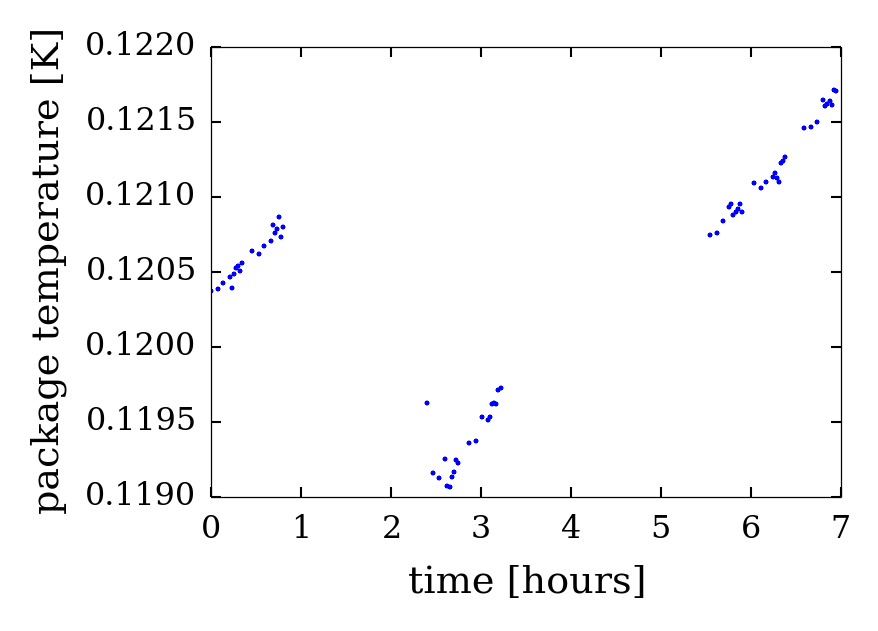

In [8]:
plt.plot((df.sweep_epoch - df.sweep_epoch.min()) / 3600, df.sweep_primary_package_temperature, '.b', ms=1)
plt.xlabel('time [hours]')
plt.ylabel('package temperature [K]');

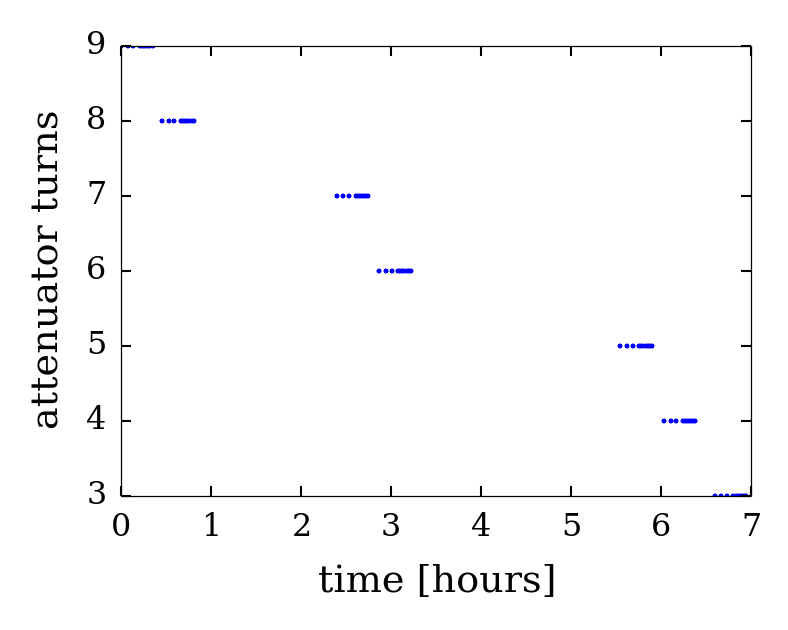

In [9]:
plt.plot((df.sweep_epoch - df.sweep_epoch.min()) / 3600, df.mmw_atten_total_turns / 2, '.', ms=1)
plt.xlabel('time [hours]')
plt.ylabel('attenuator turns');

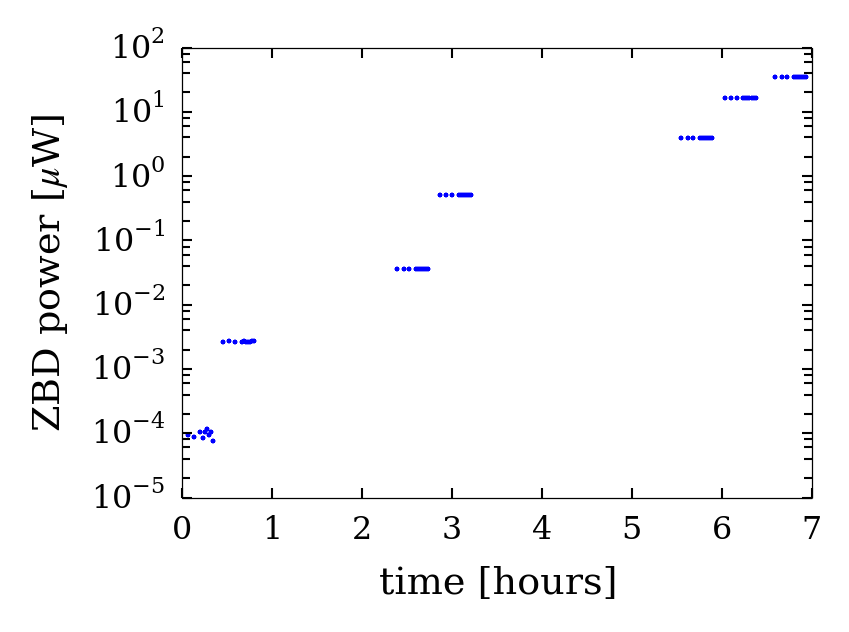

In [10]:
plt.semilogy((df.sweep_epoch - df.sweep_epoch.min()) / 3600, 1e6 * df.zbd_power, '.', ms=1)
plt.xlabel('time [hours]')
plt.ylabel('ZBD power [$\mu$W]');

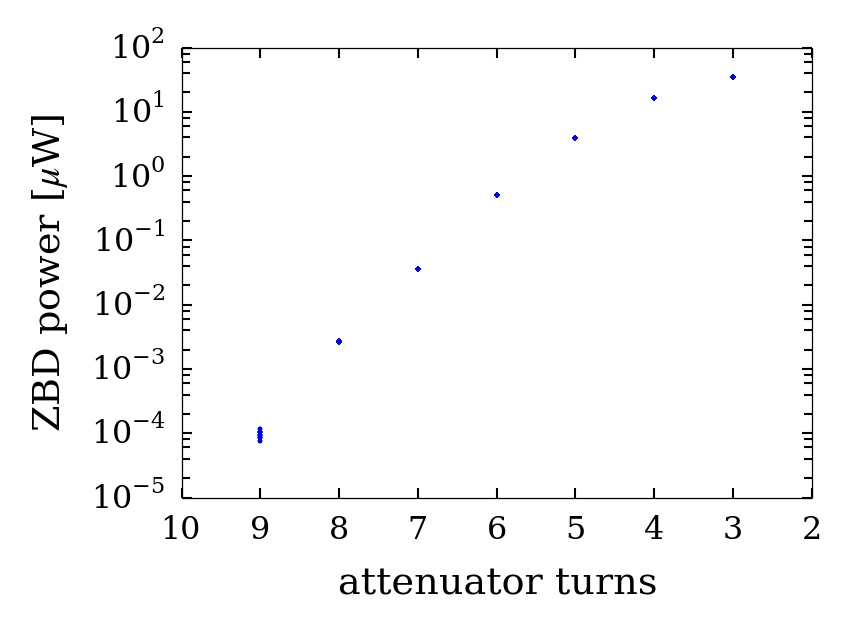

In [11]:
plt.semilogy(df.mmw_atten_total_turns / 2, 1e6 * df.zbd_power, '.', ms=1)
plt.xlabel('attenuator turns')
plt.ylabel('ZBD power [$\mu$W]')
plt.xlim(10, 2);

# Sweeps and Streams

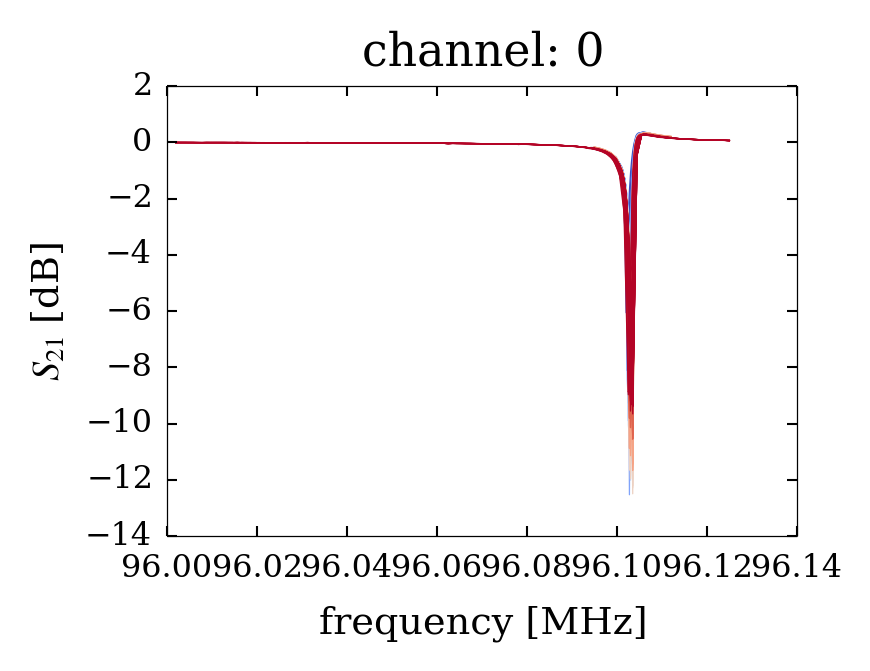

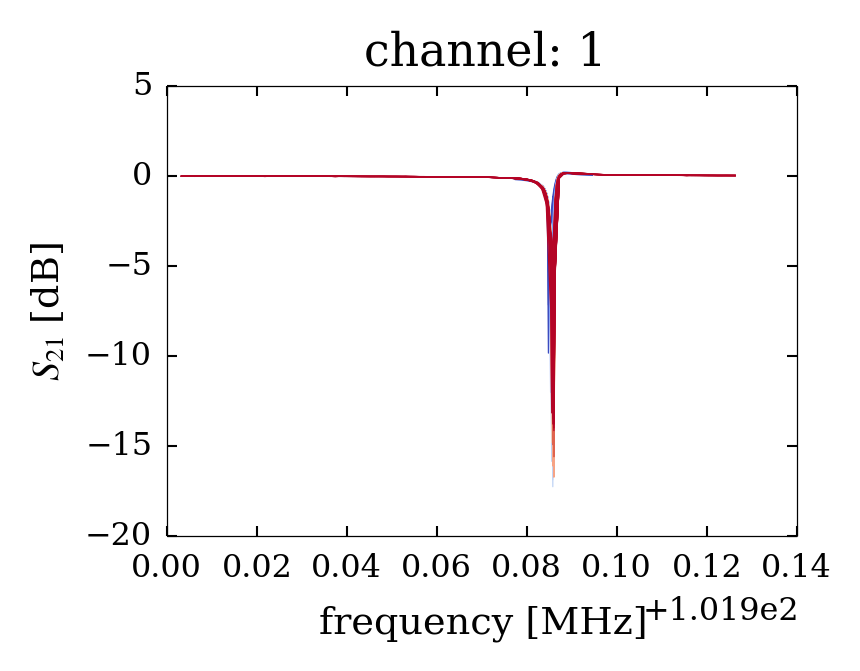

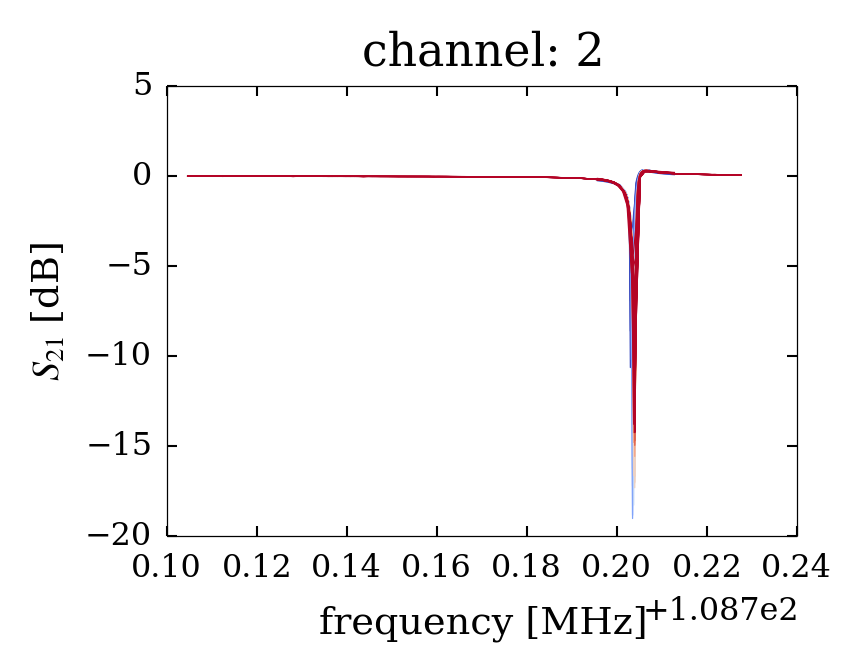

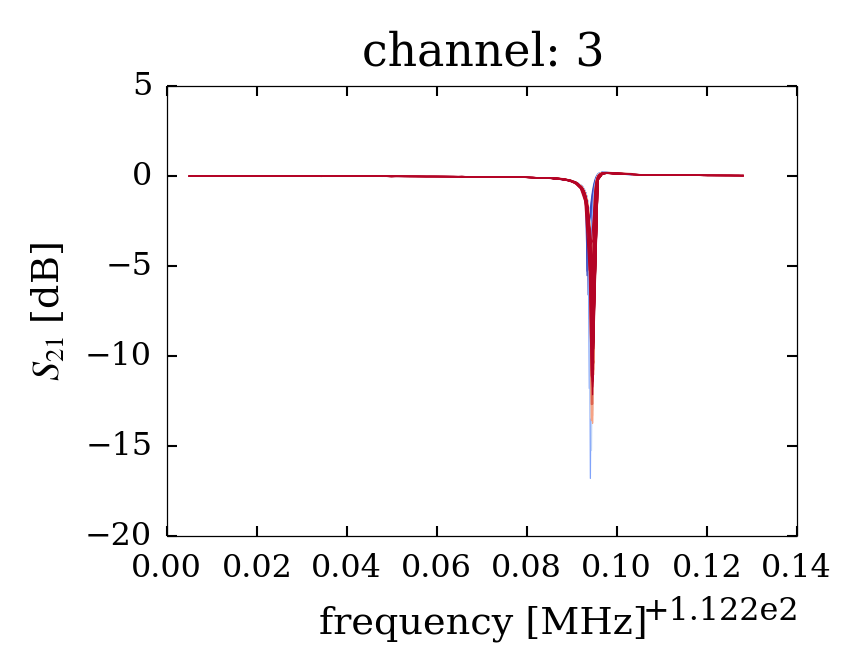

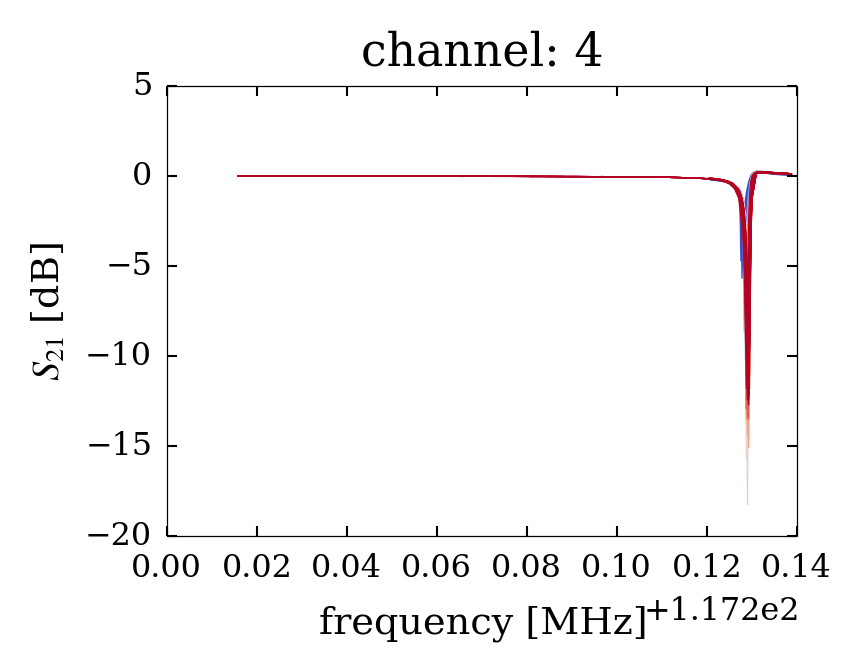

...

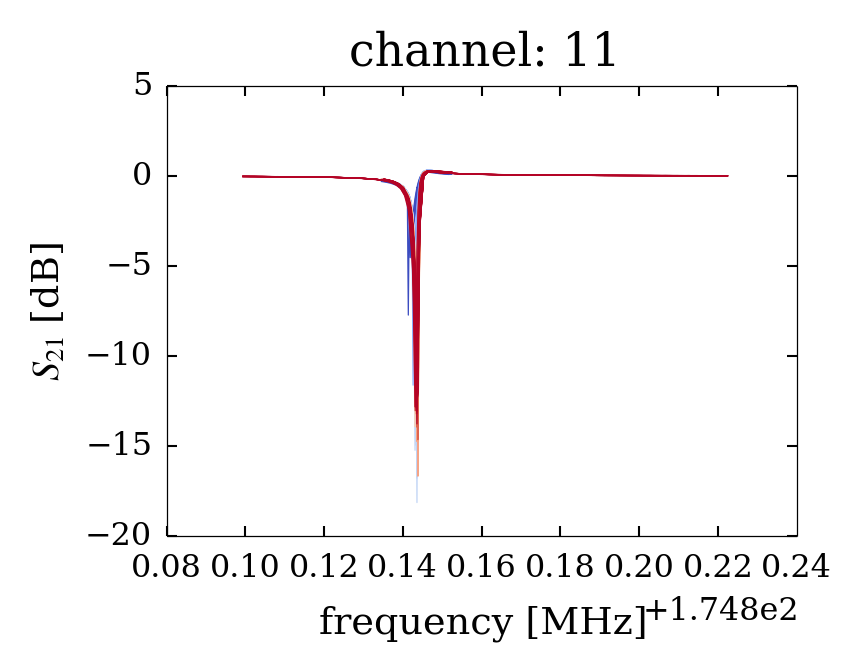

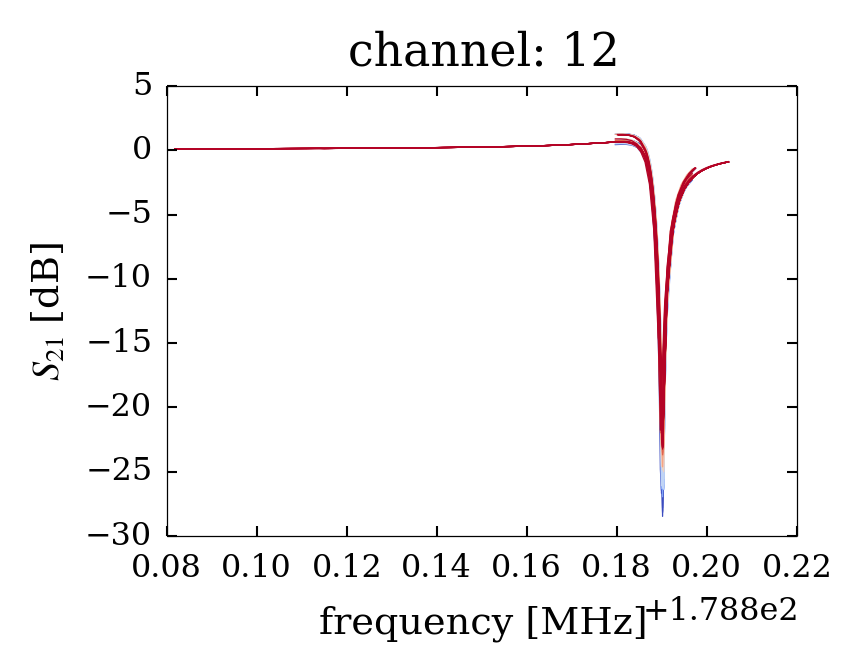

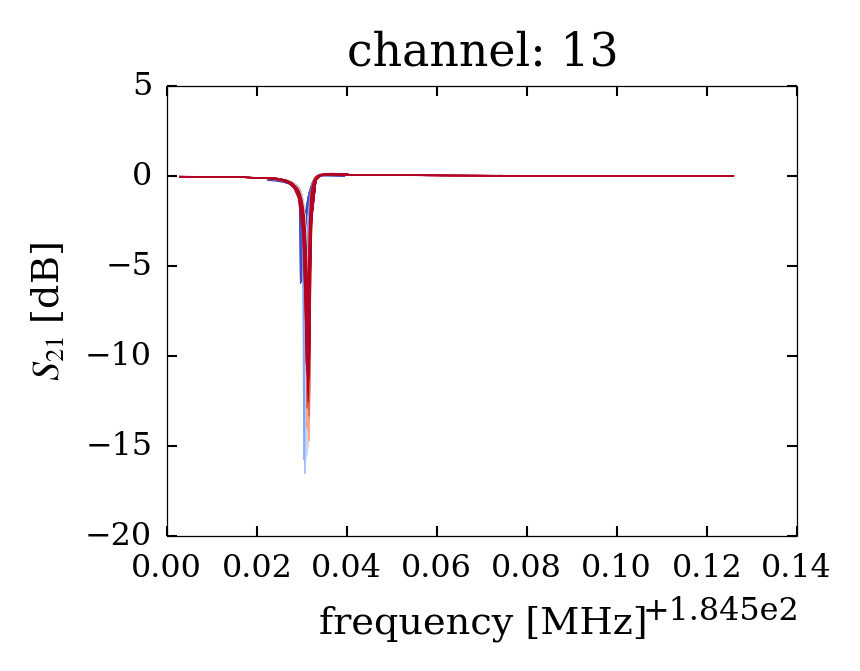

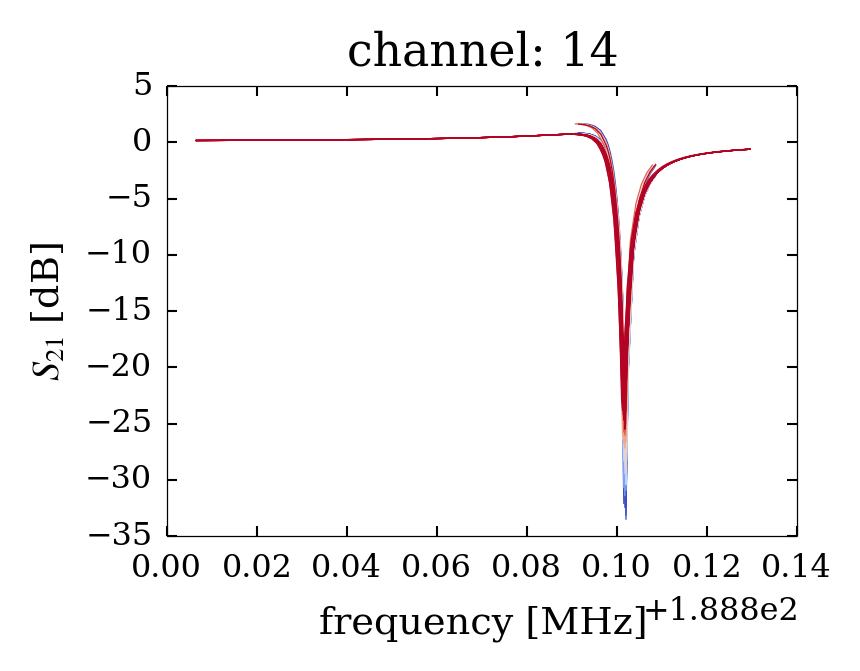

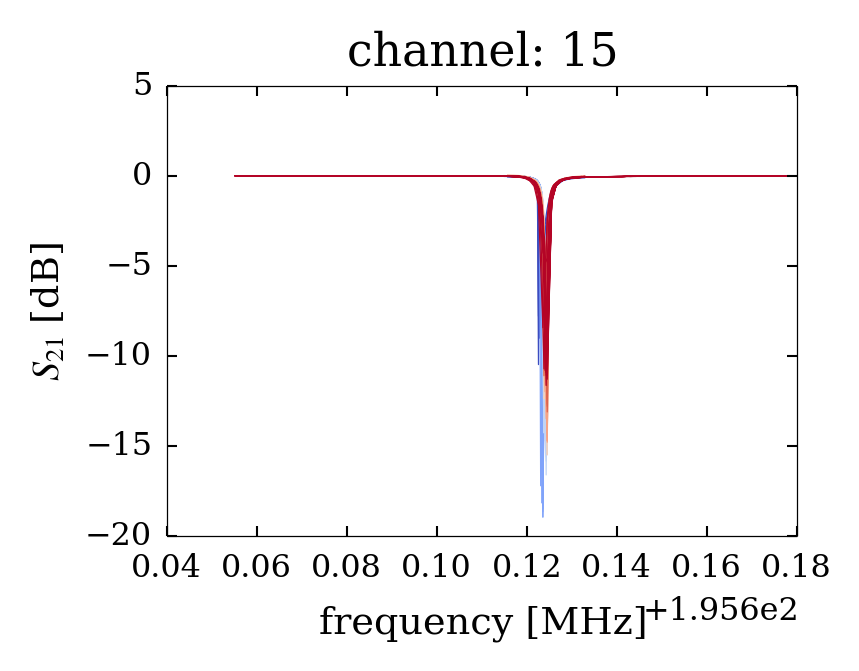

In [12]:
[plot_dataframe.plot_sweeps(df, c, color_key='atten') for c in channels];

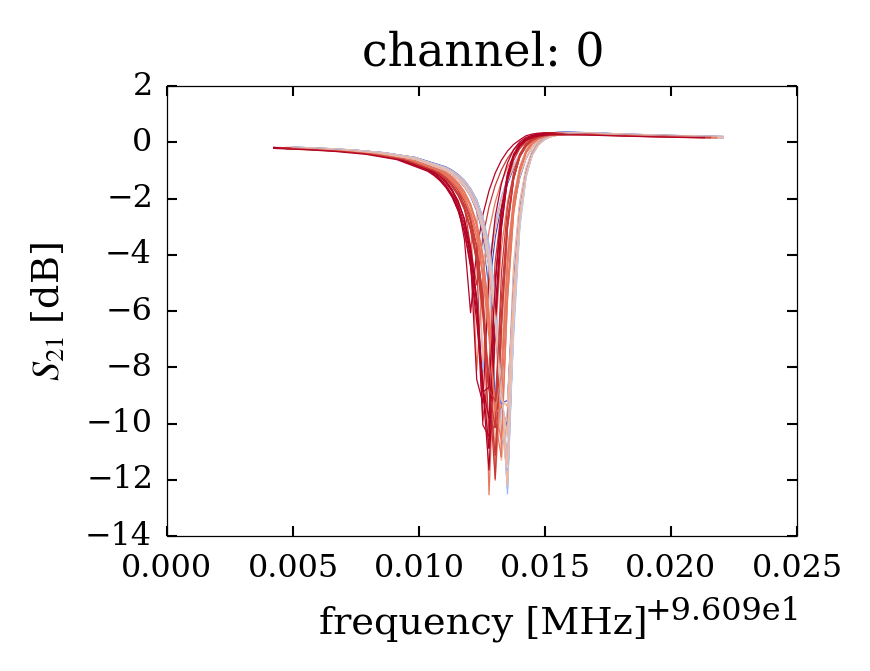

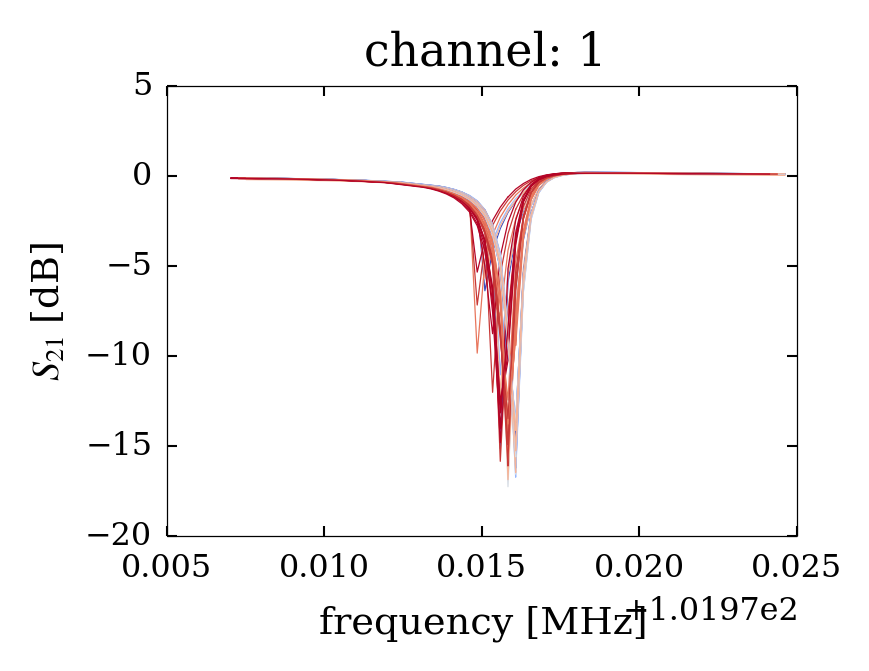

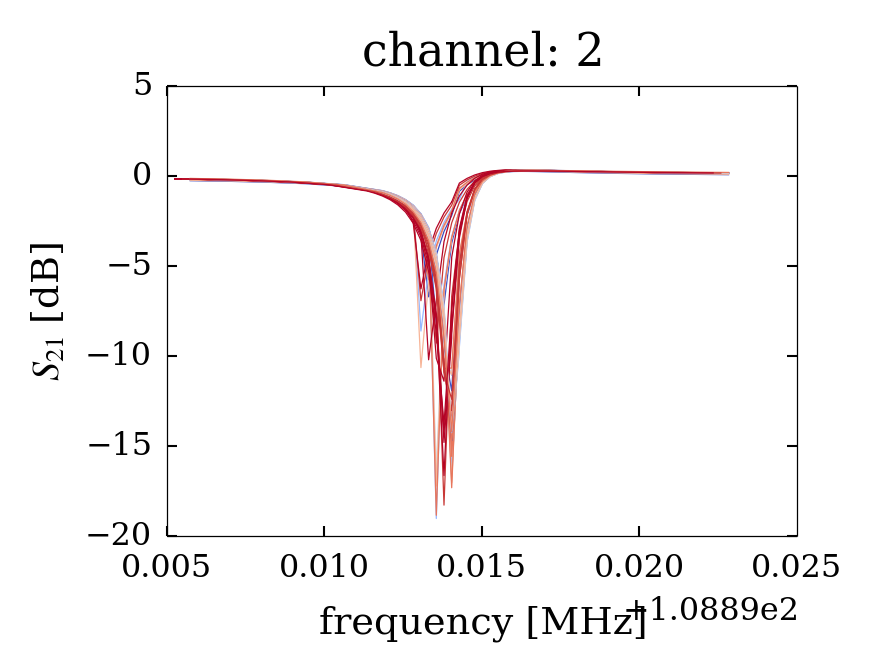

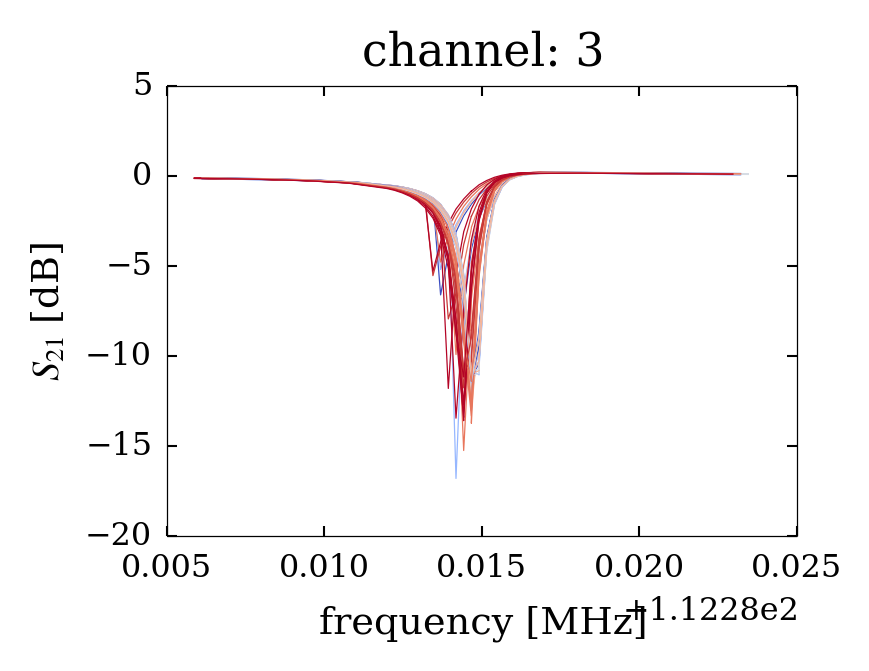

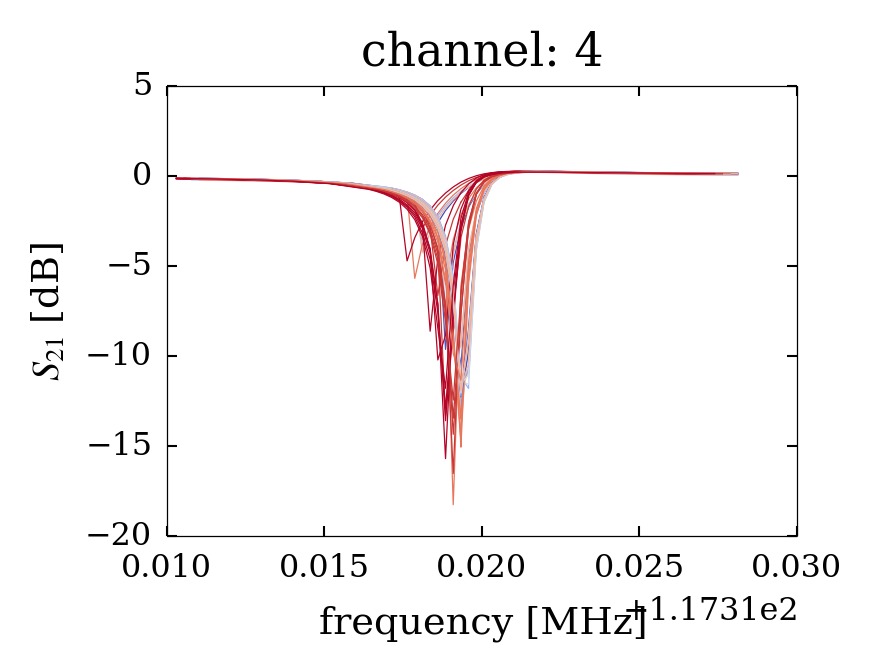

...

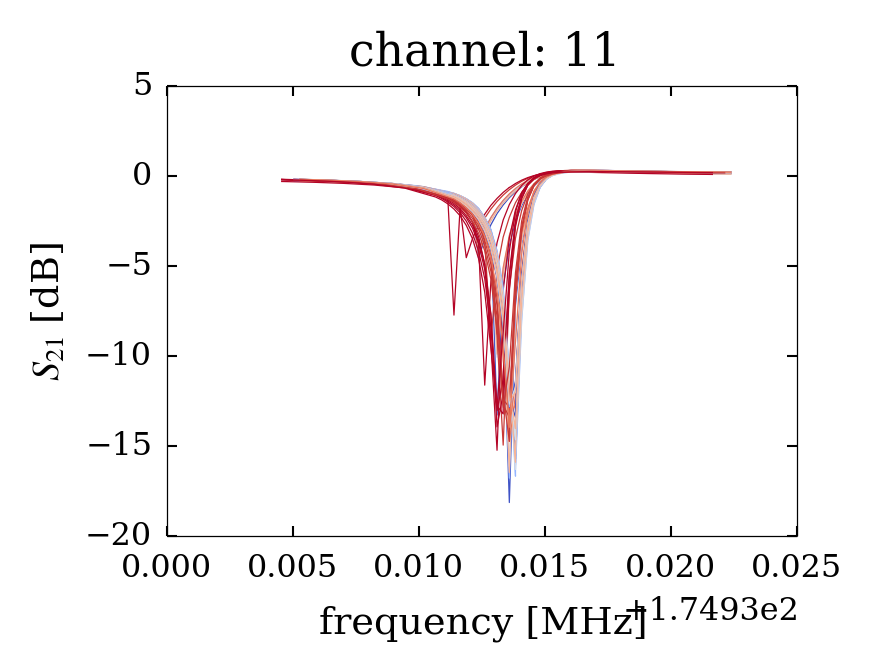

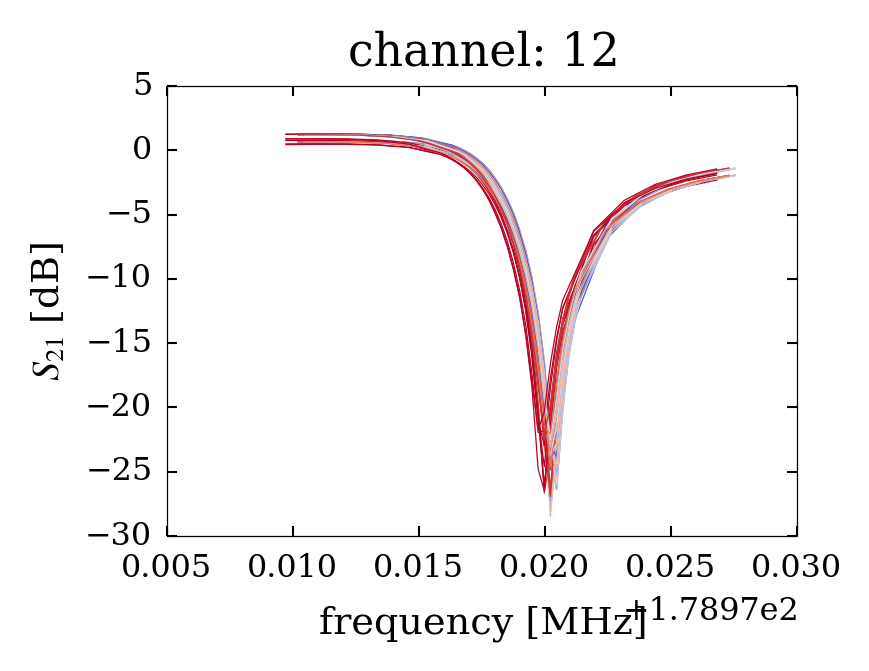

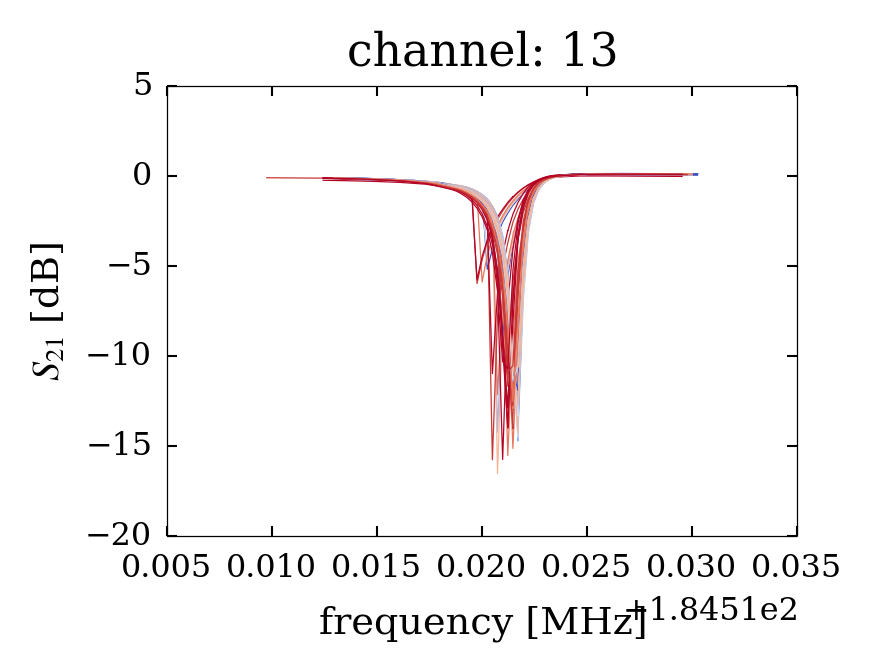

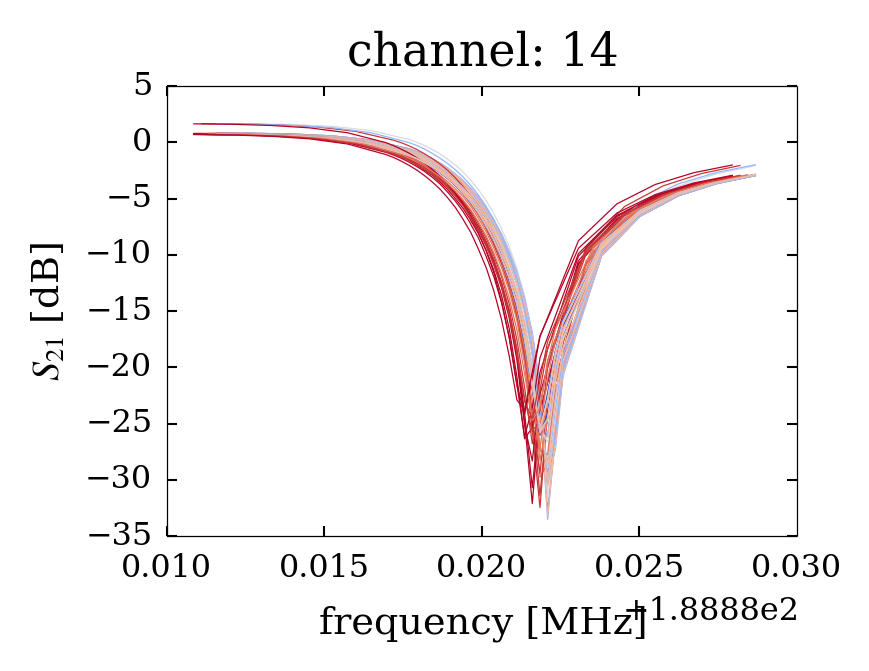

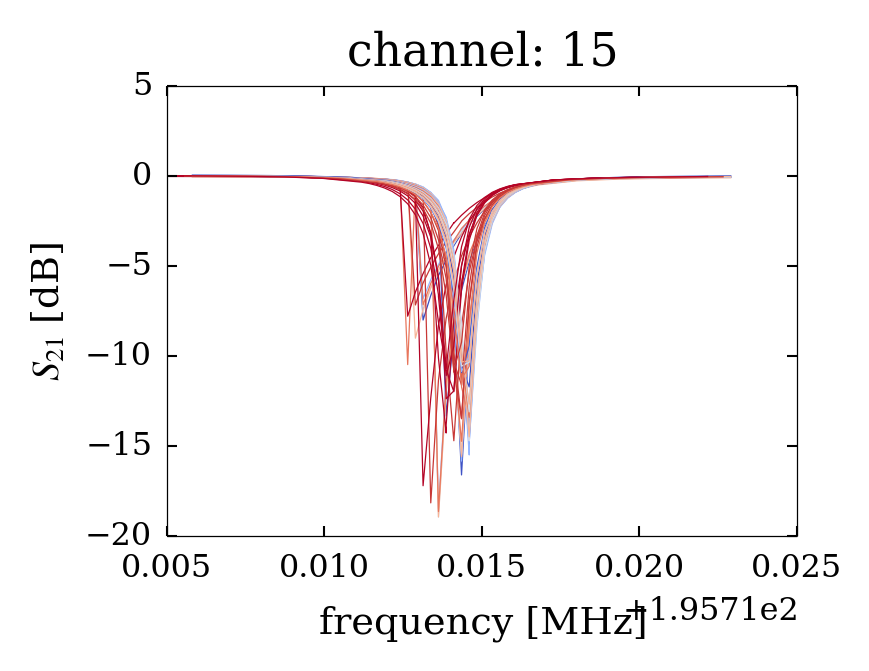

In [20]:
[plot_dataframe.plot_sweeps(df[(df.timestream_modulation_duty_cycle==0)], c, color_key='source_power') for c in channels];

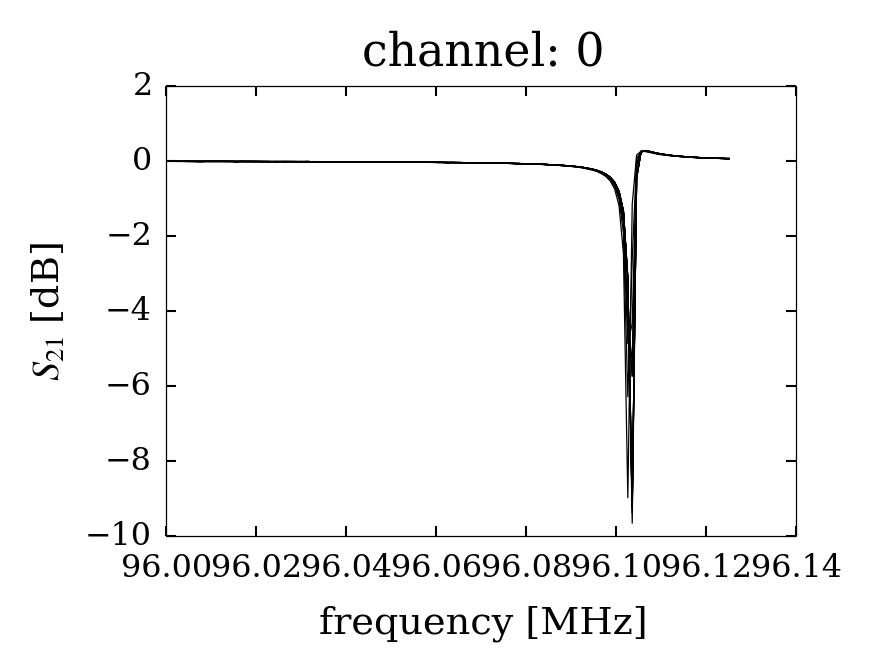

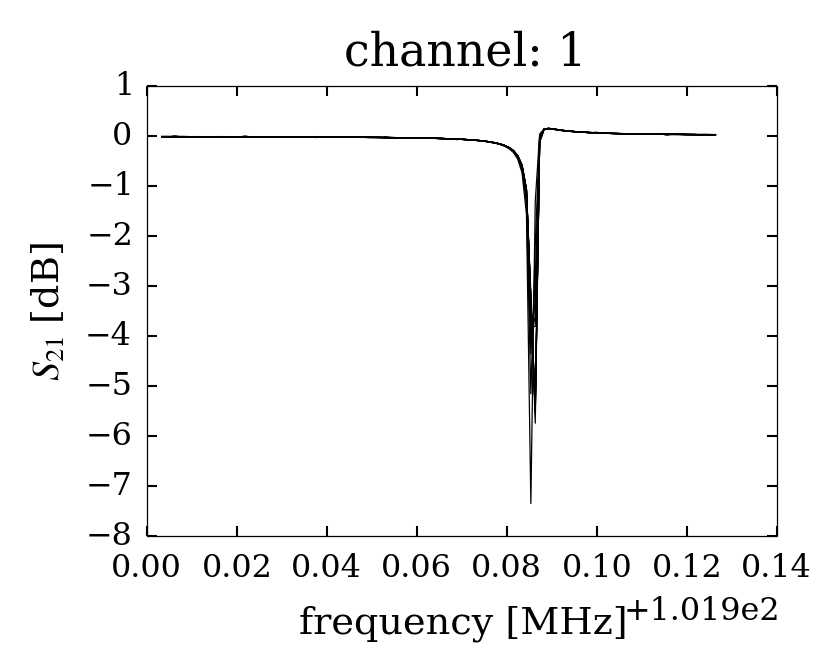

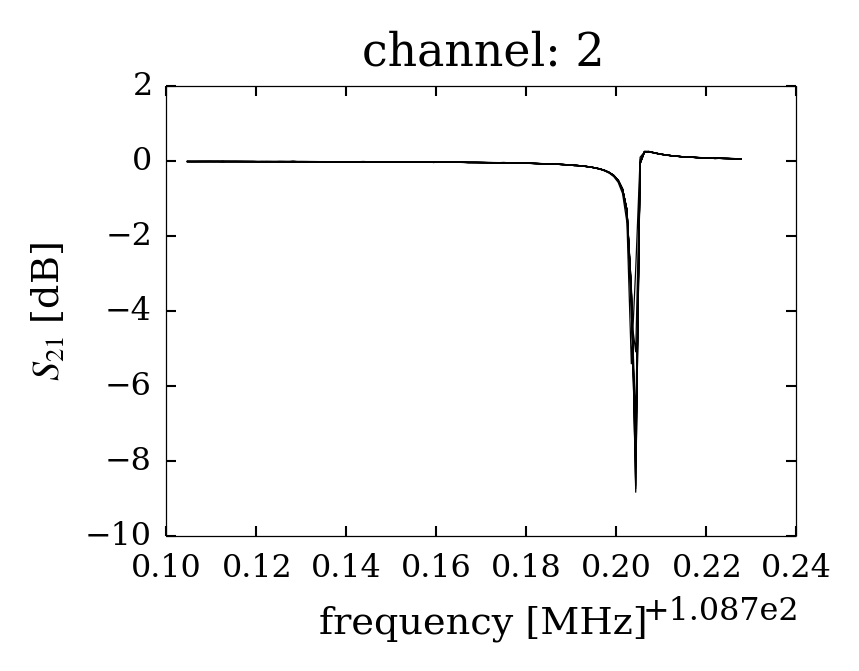

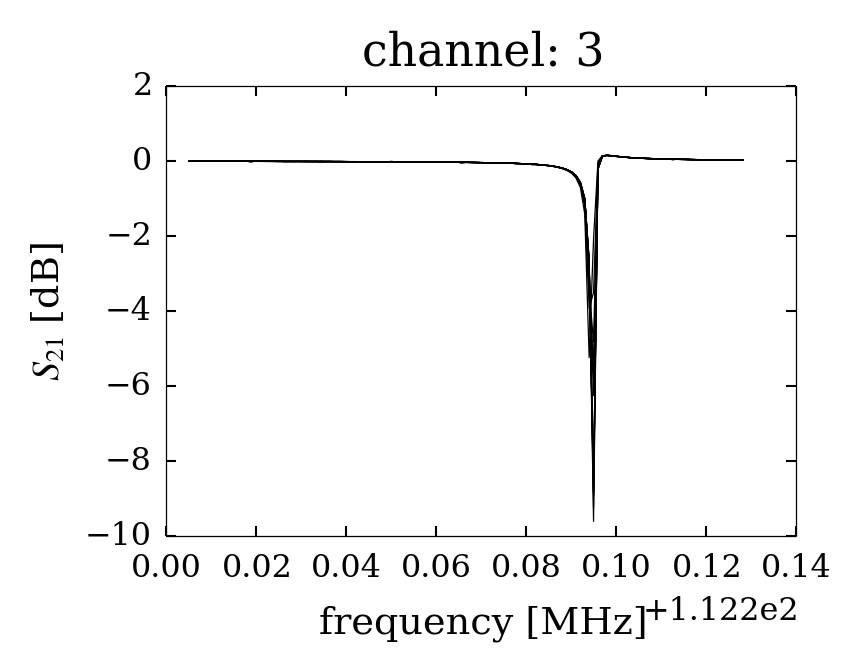

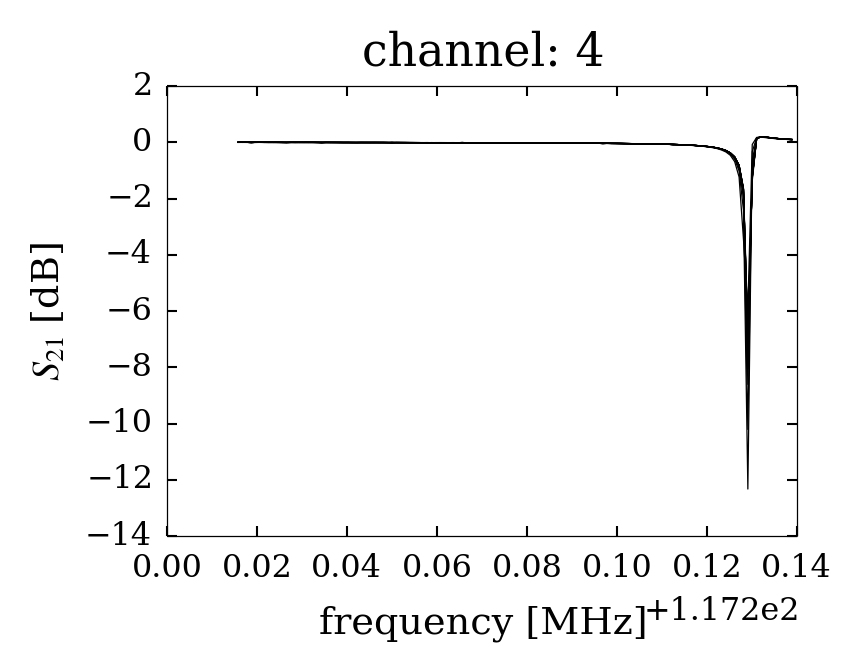

...

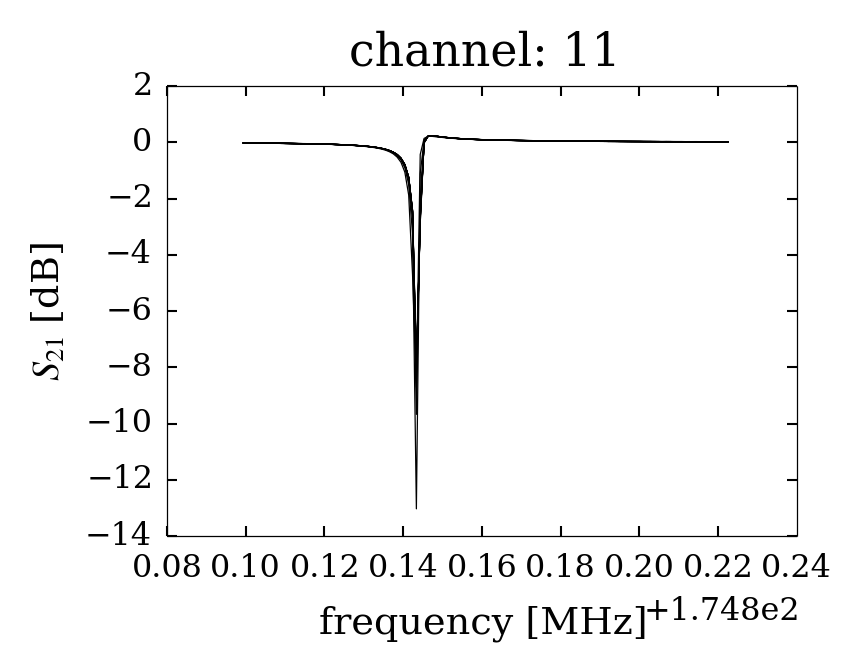

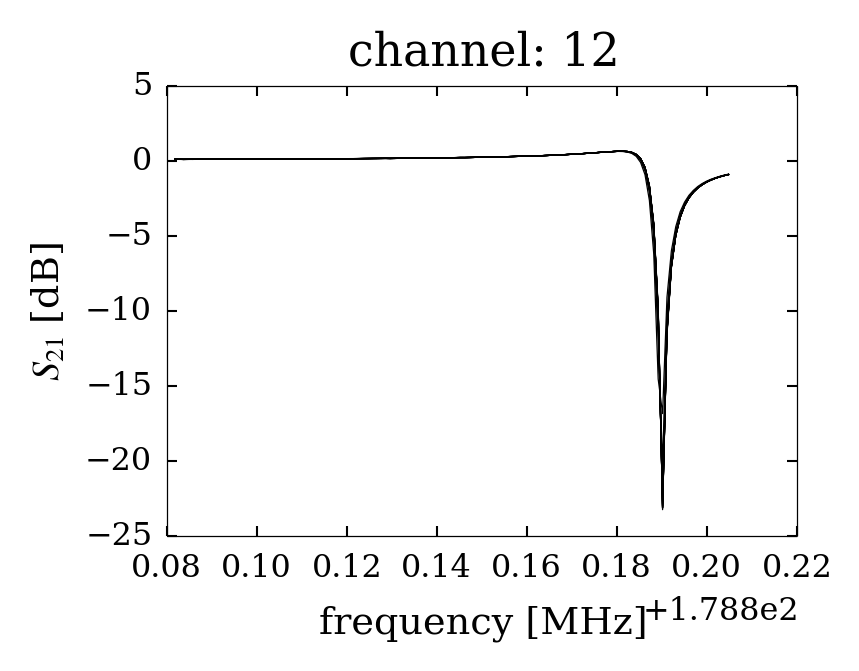

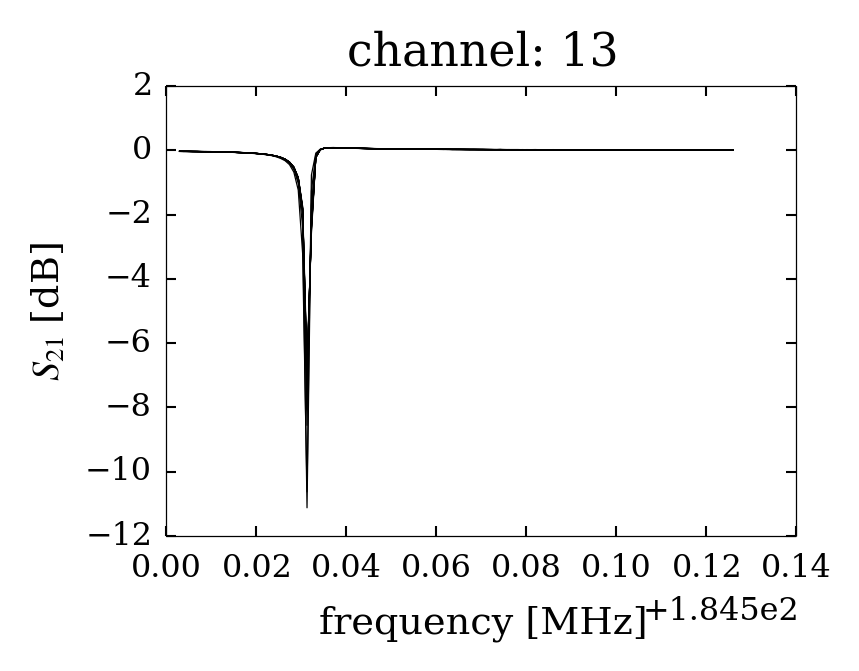

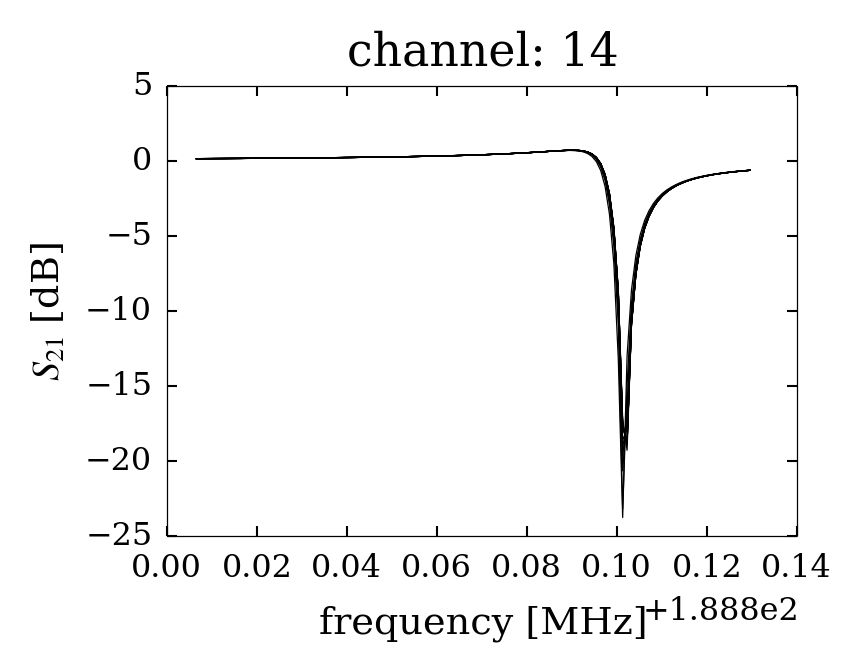

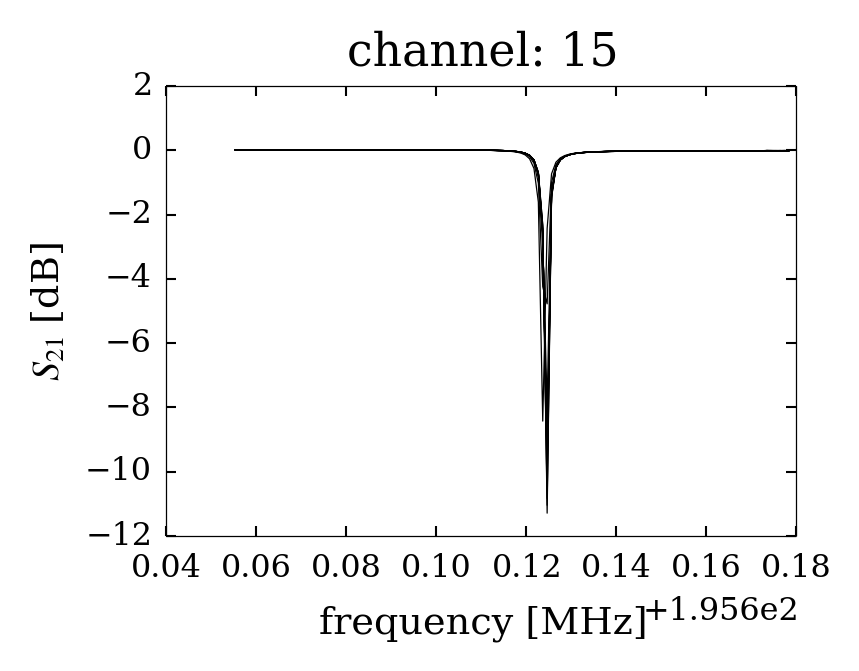

In [14]:
[plot_dataframe.plot_sweeps(df[(df.timestream_modulation_duty_cycle==0.5)], c) for c in channels];

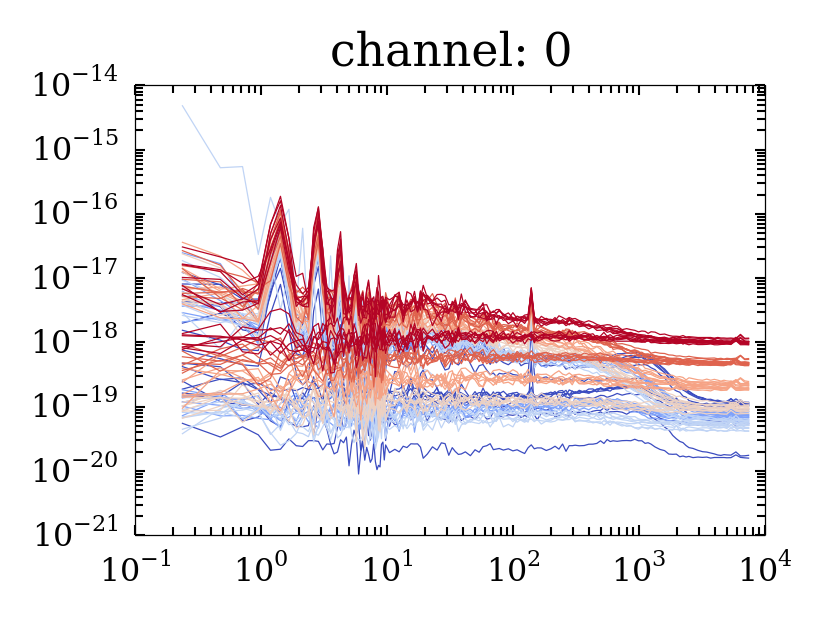

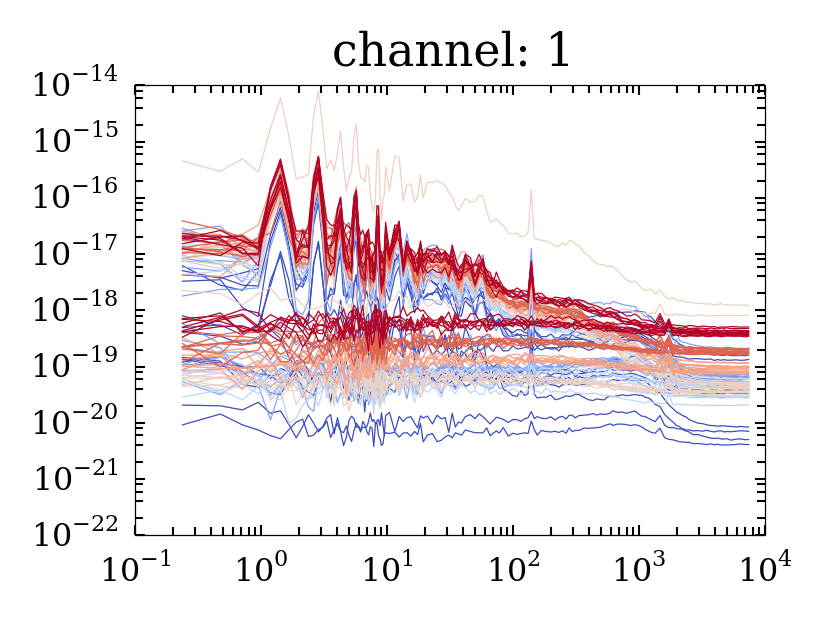

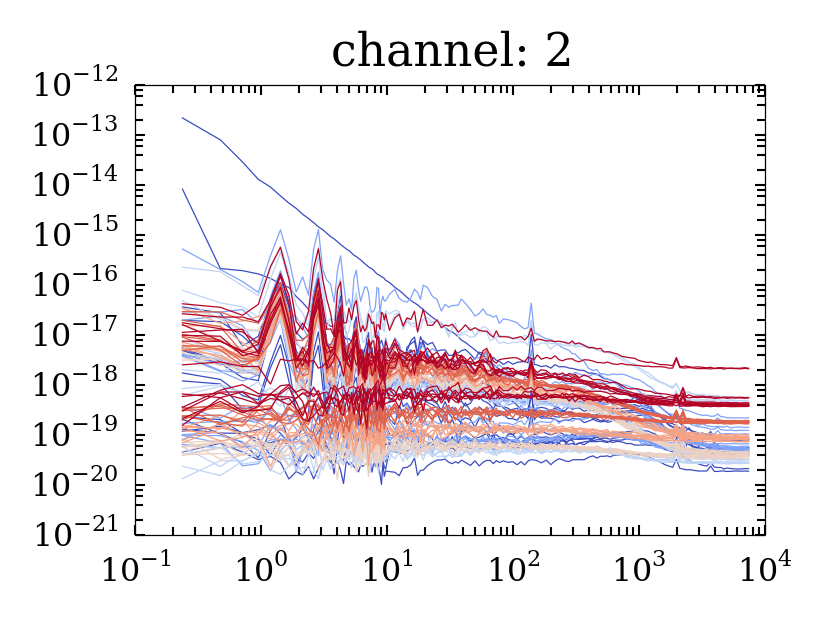

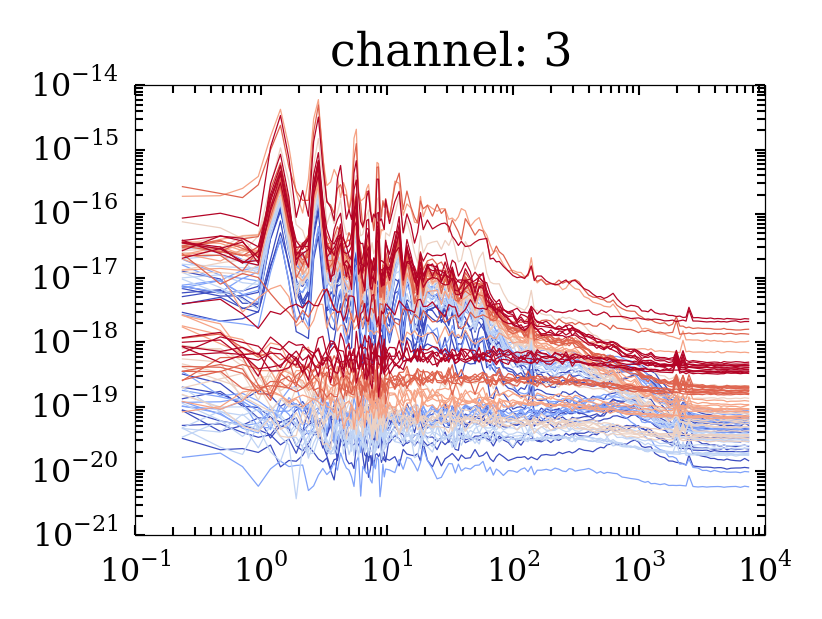

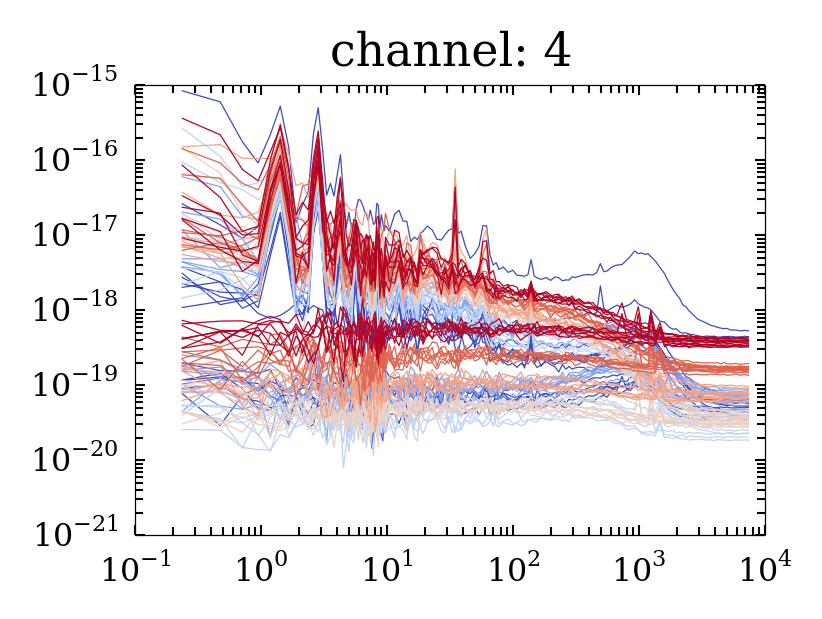

...

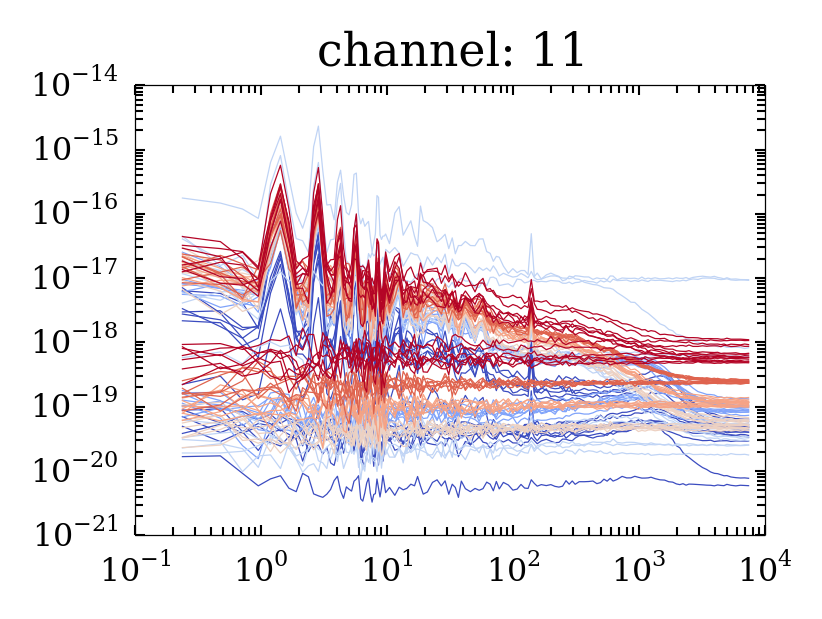

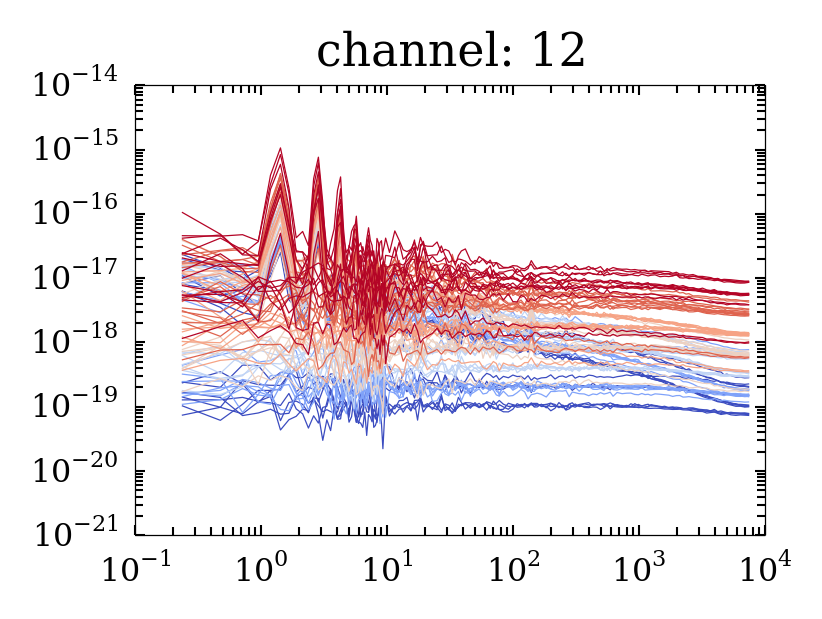

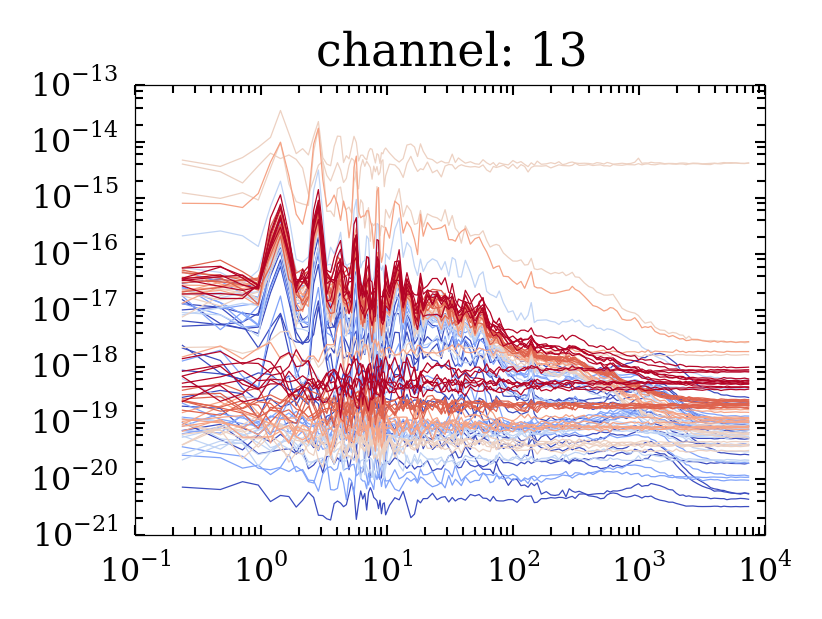

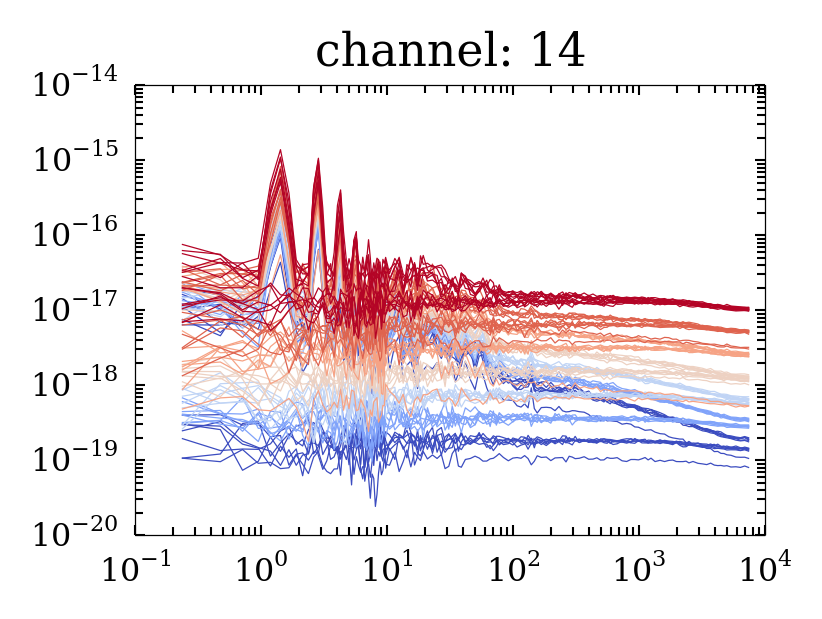

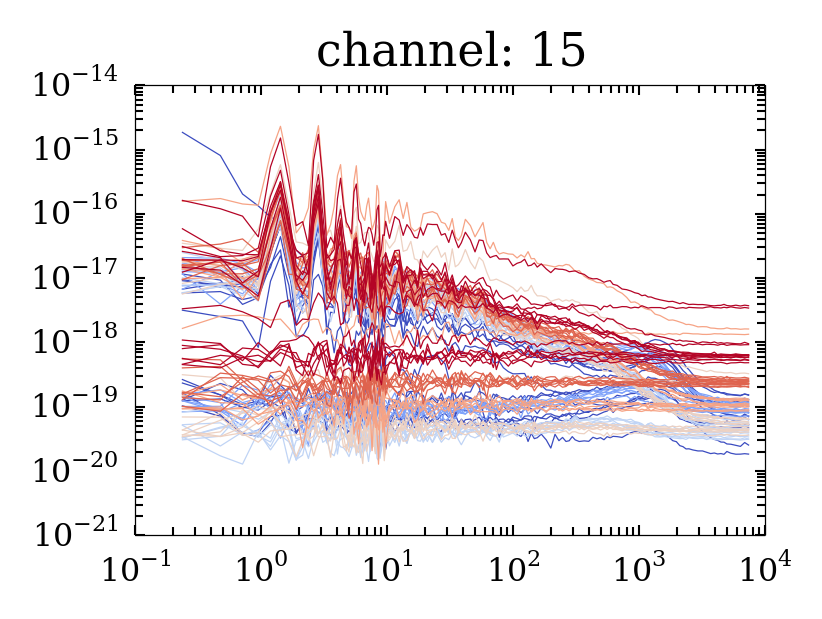

In [15]:
[plot_dataframe.plot_pca_noise(df[df.timestream_modulation_duty_cycle==0], c, color_key='atten')
 for c in channels];

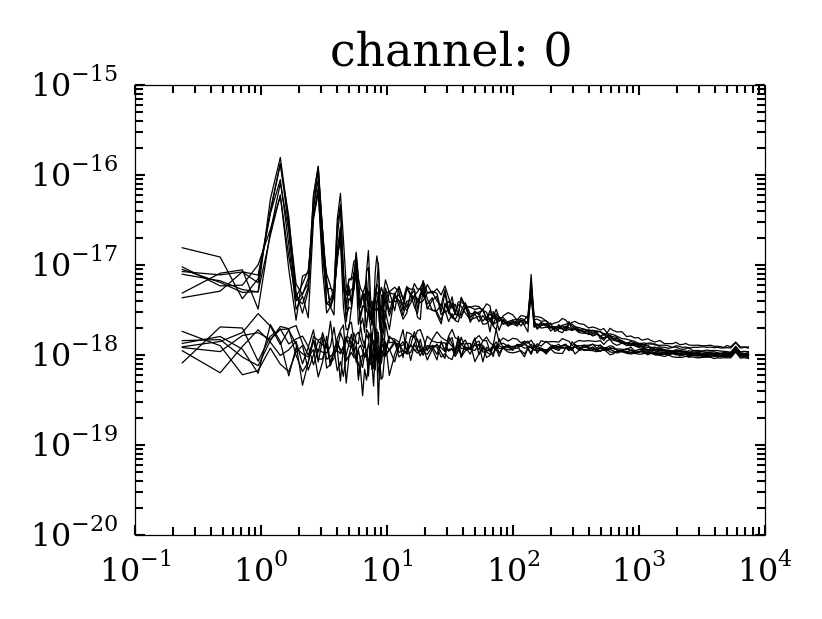

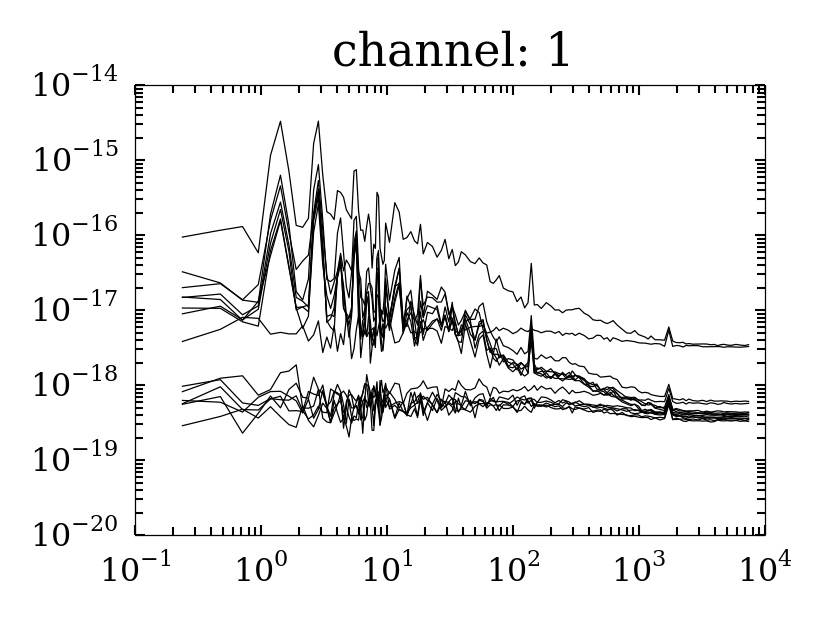

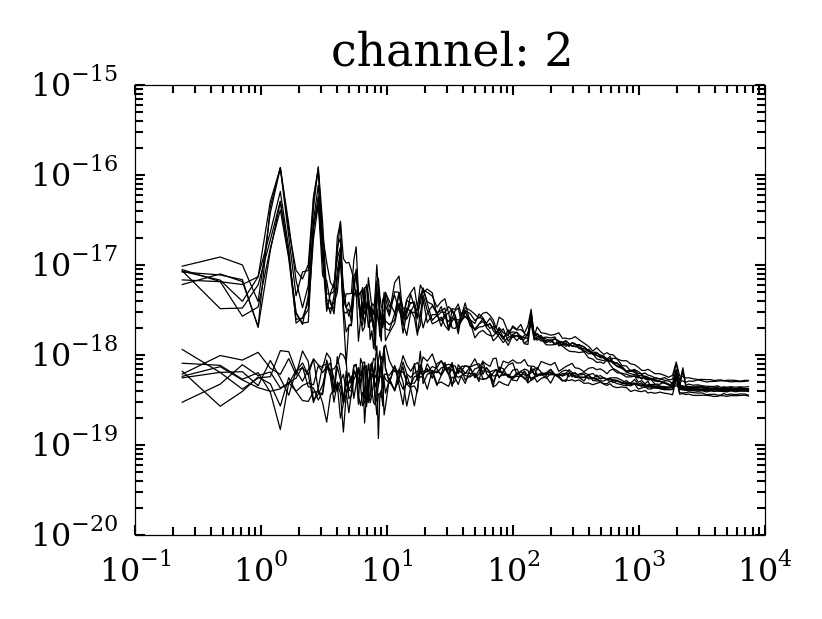

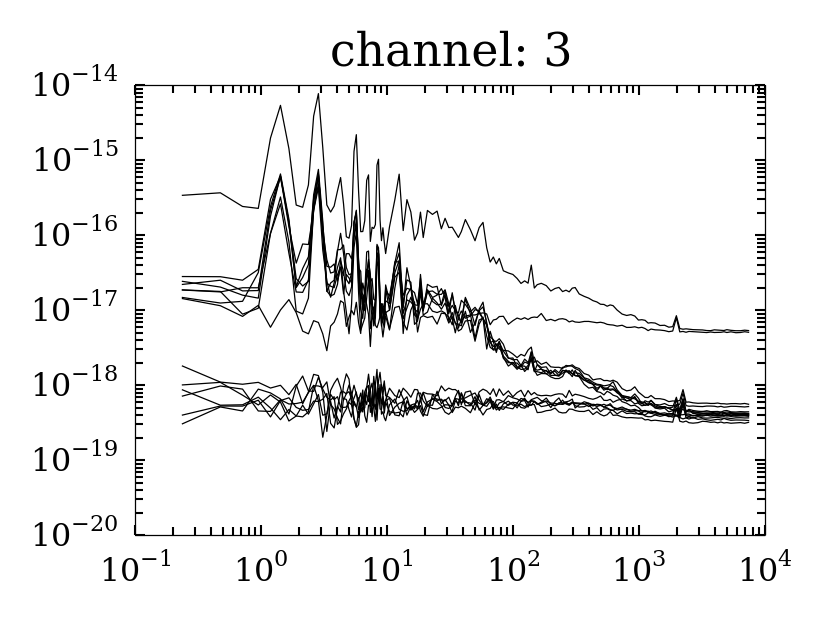

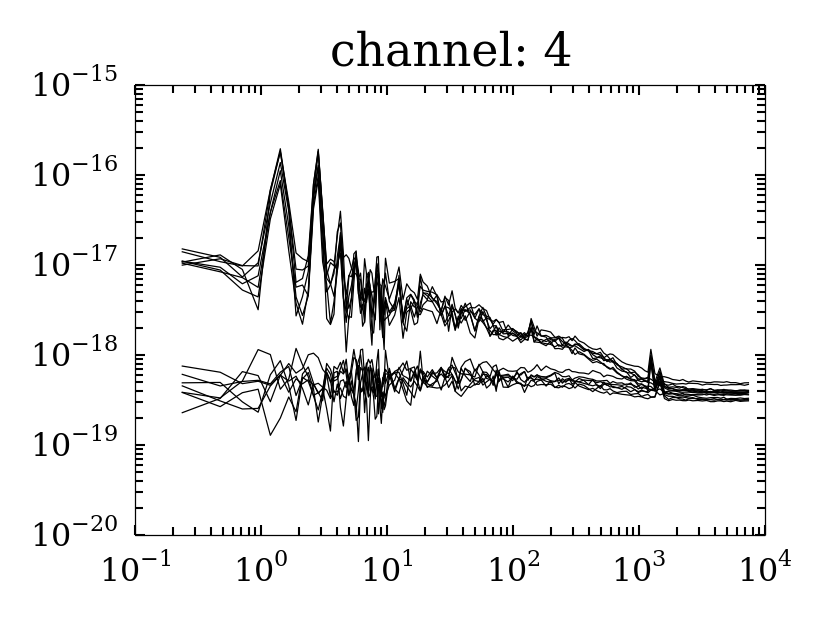

...

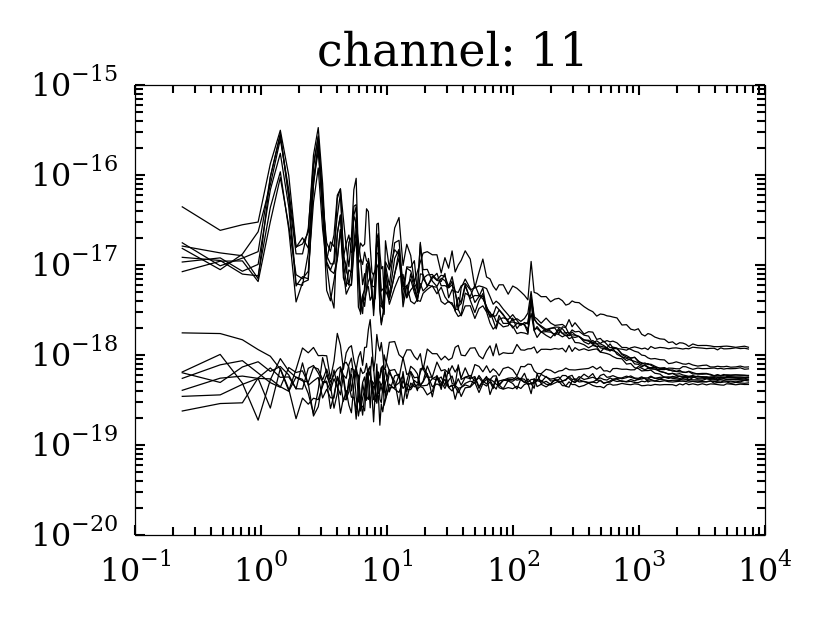

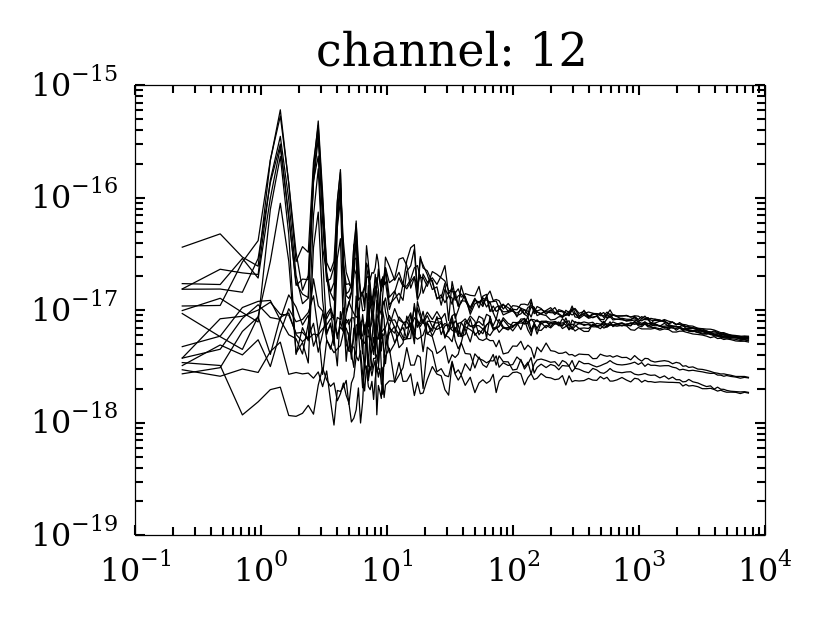

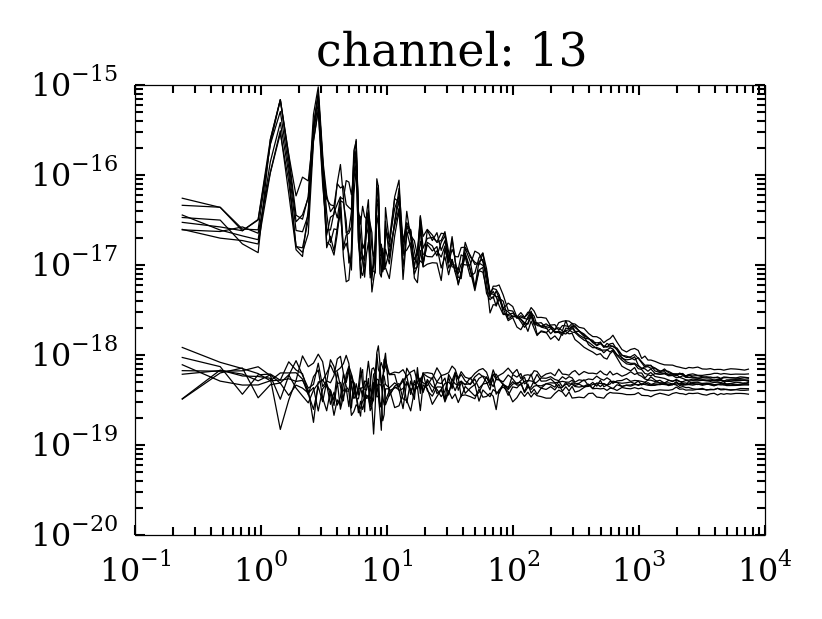

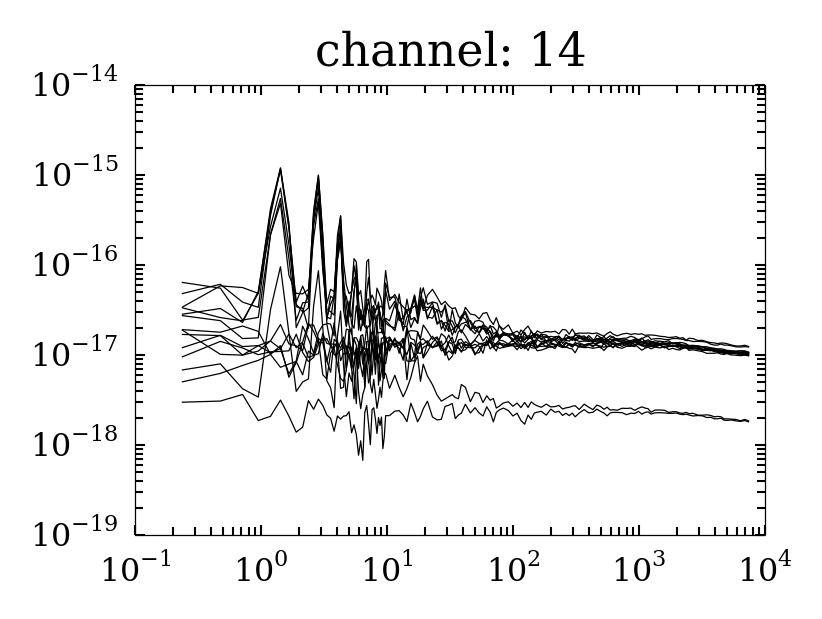

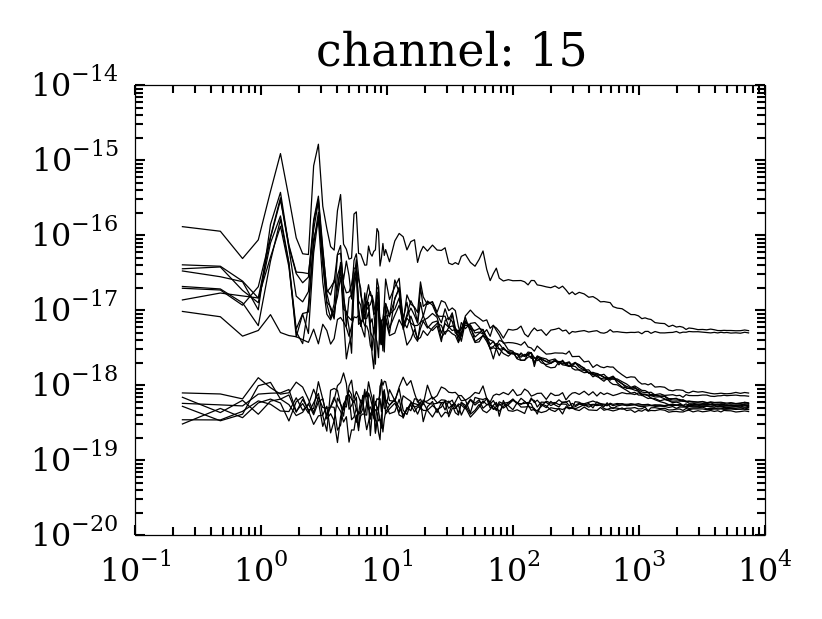

In [16]:
[plot_dataframe.plot_pca_noise(df[df.timestream_modulation_duty_cycle==1], c) for c in channels];

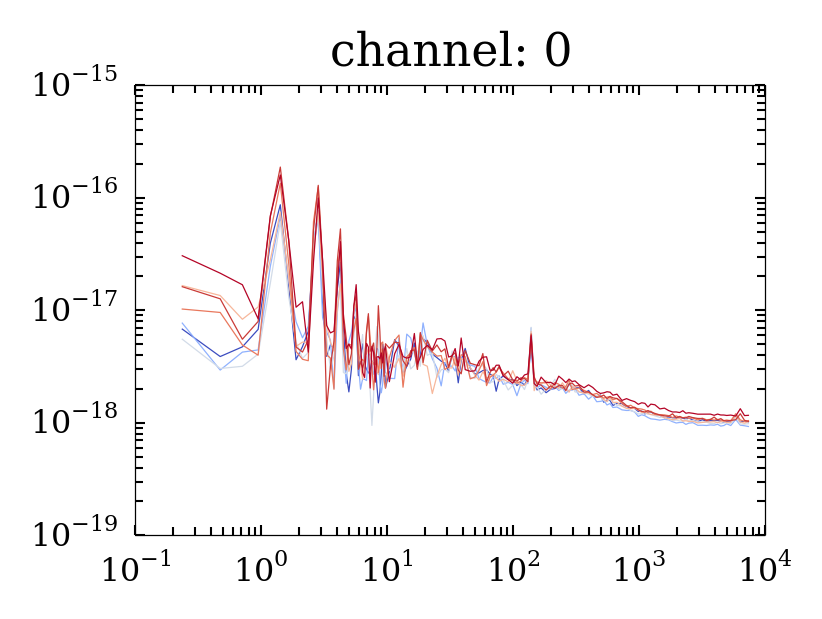

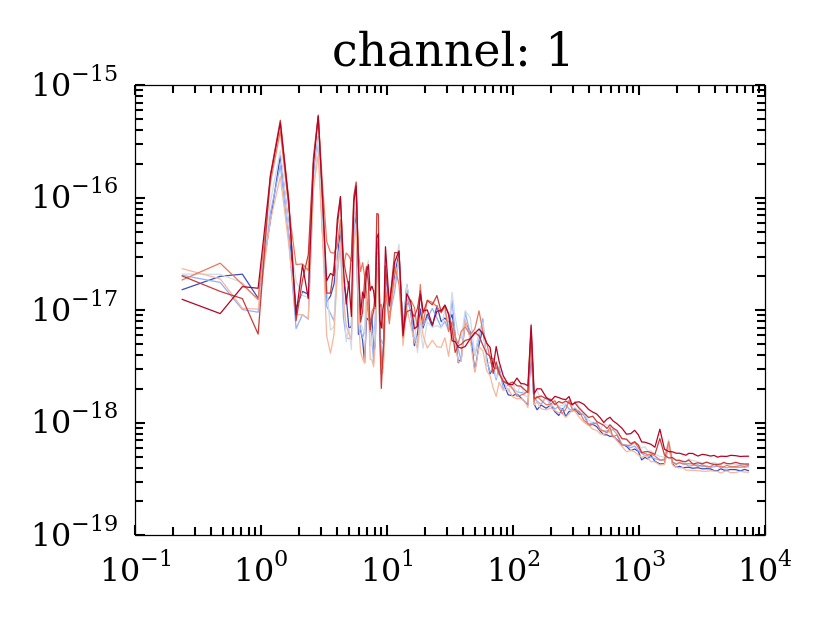

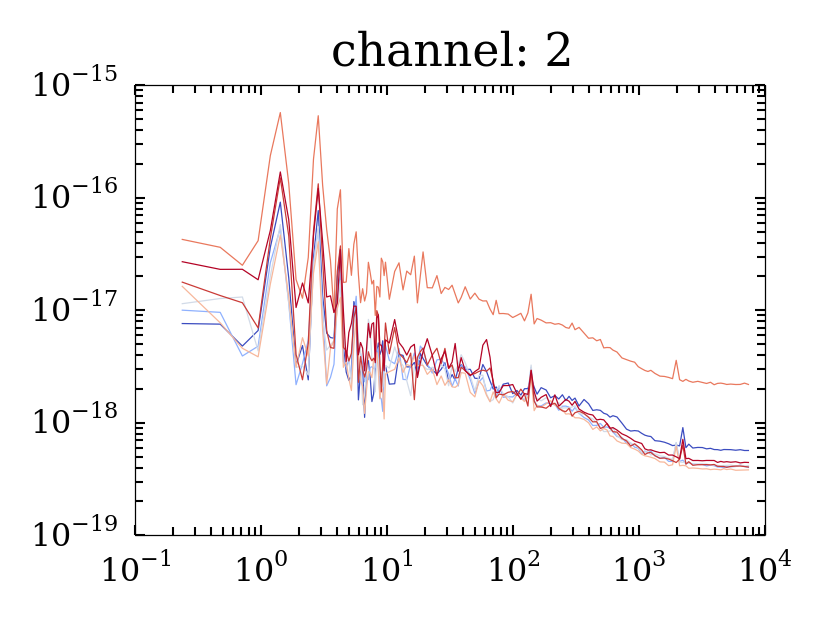

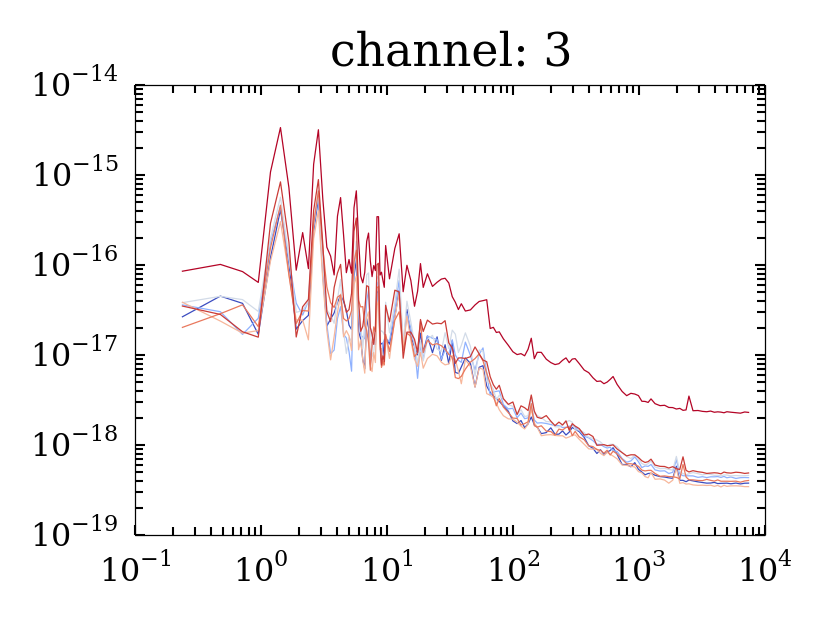

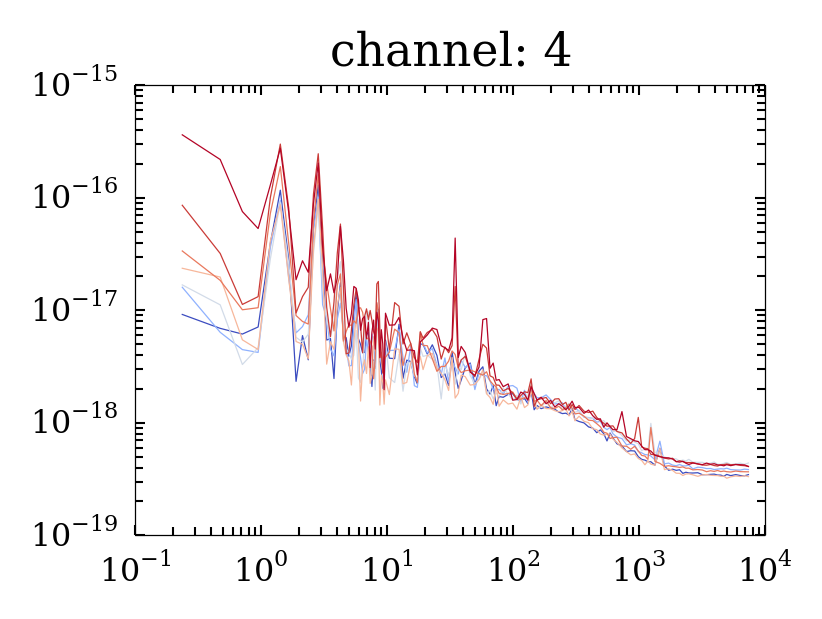

...

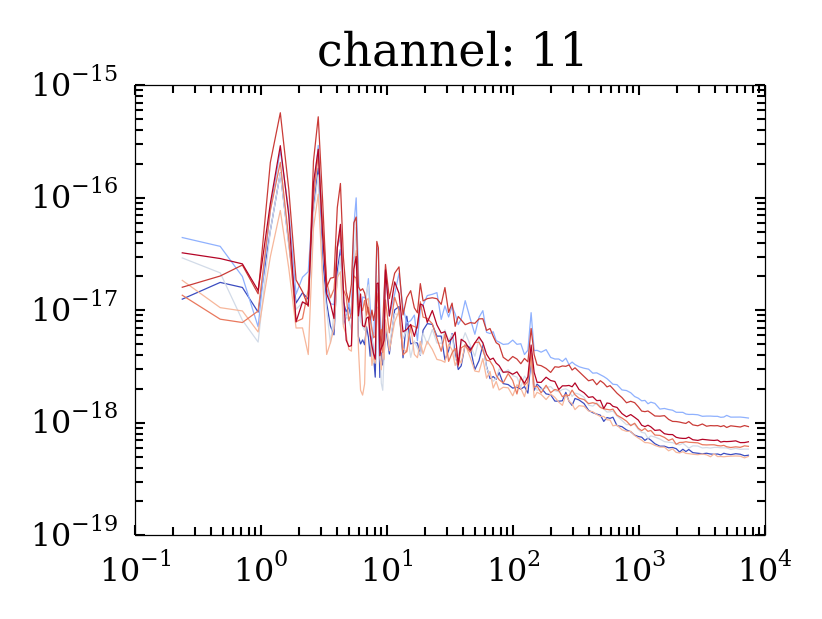

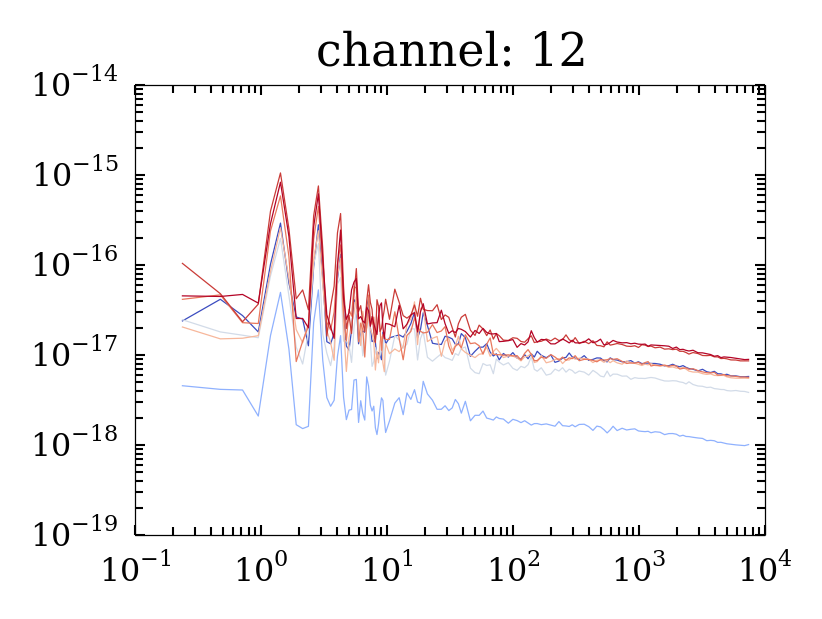

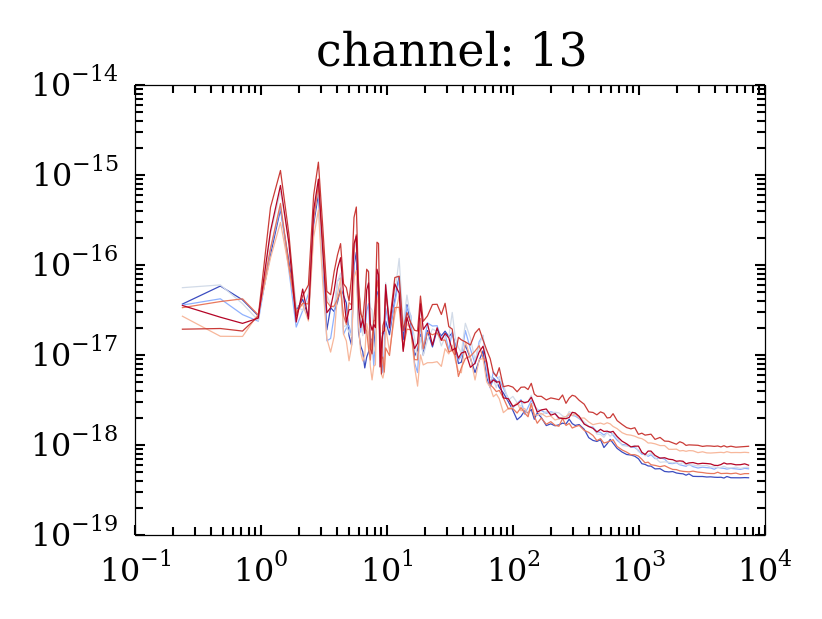

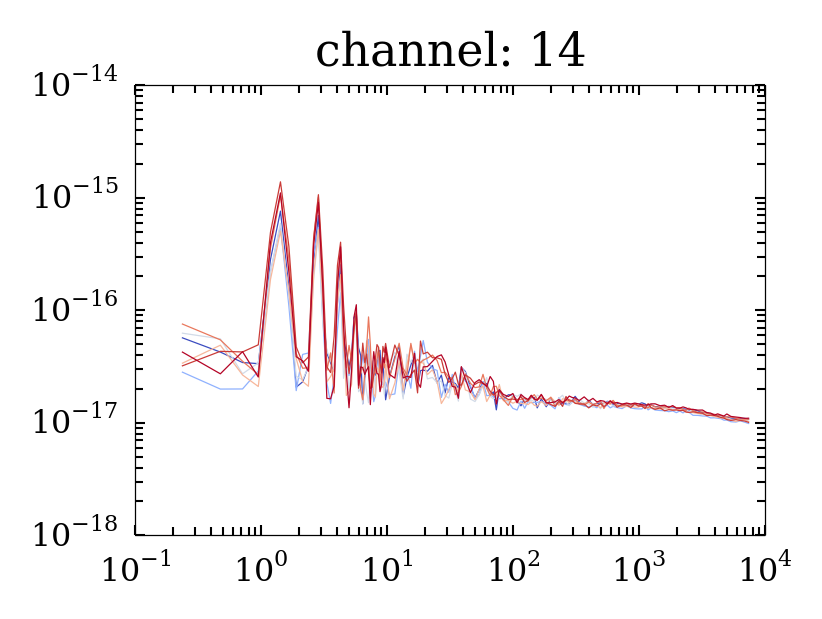

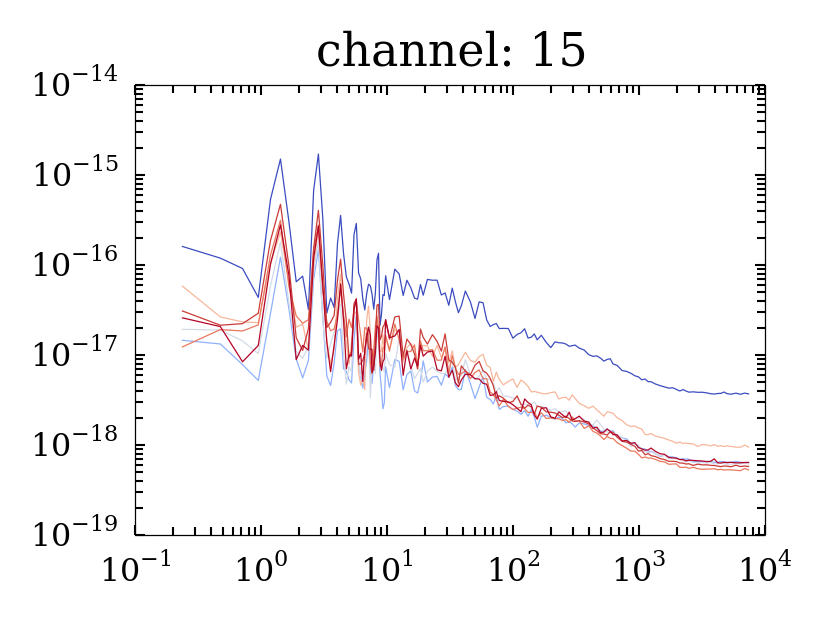

In [17]:
[plot_dataframe.plot_pca_noise(df[(df.timestream_modulation_duty_cycle==0) &
                                  (df.atten == 41)],
                               c, color_key='source_power', plot_row_0=False)
 for c in channels];

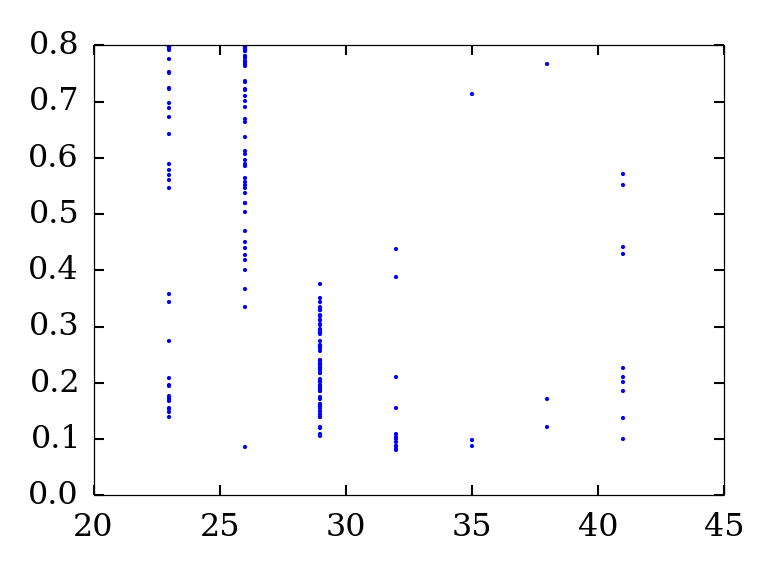

In [18]:
mask = (df.timestream_modulation_duty_cycle==0) & df.resonator_fit_good
plt.plot(df[mask].atten, df[mask].a, '.', ms=1)

# Responsivity

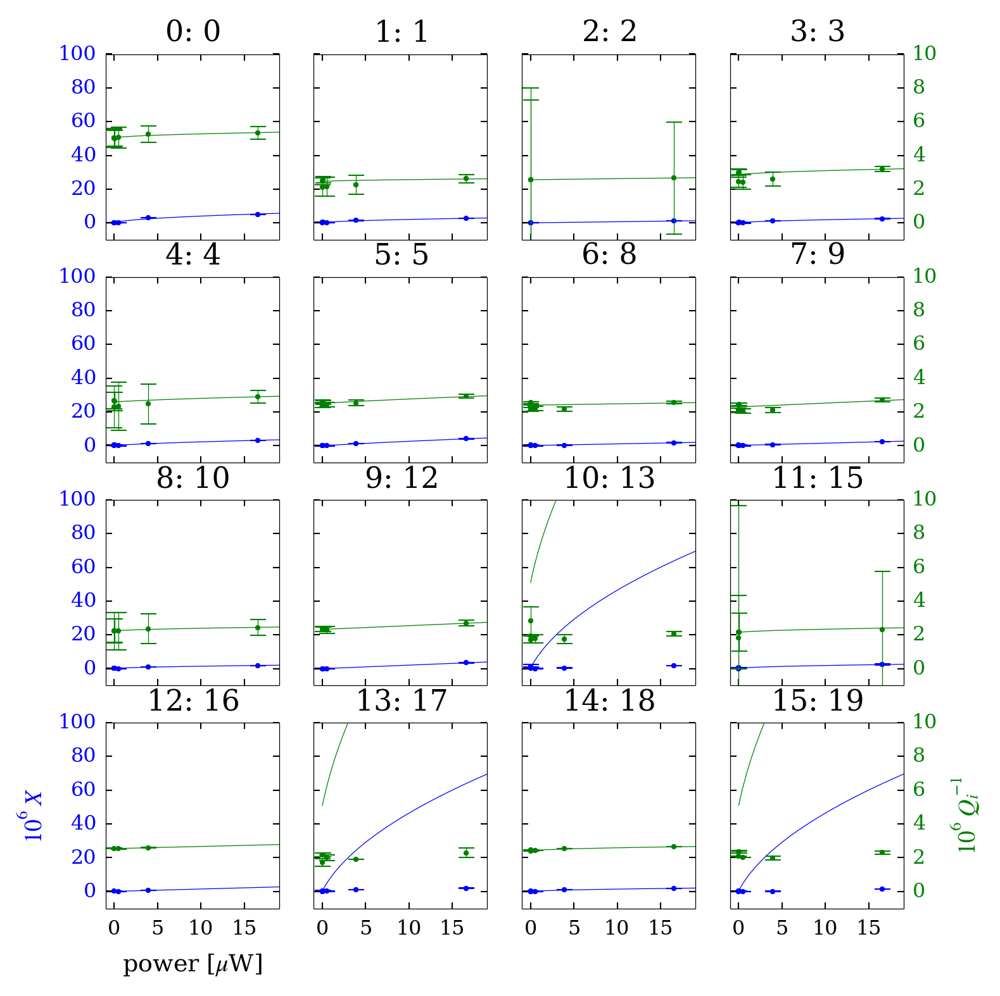

In [22]:
fig, X_axes, I_axes = plot_dataframe.plot_response(df[df.atten==41], 'source_power')

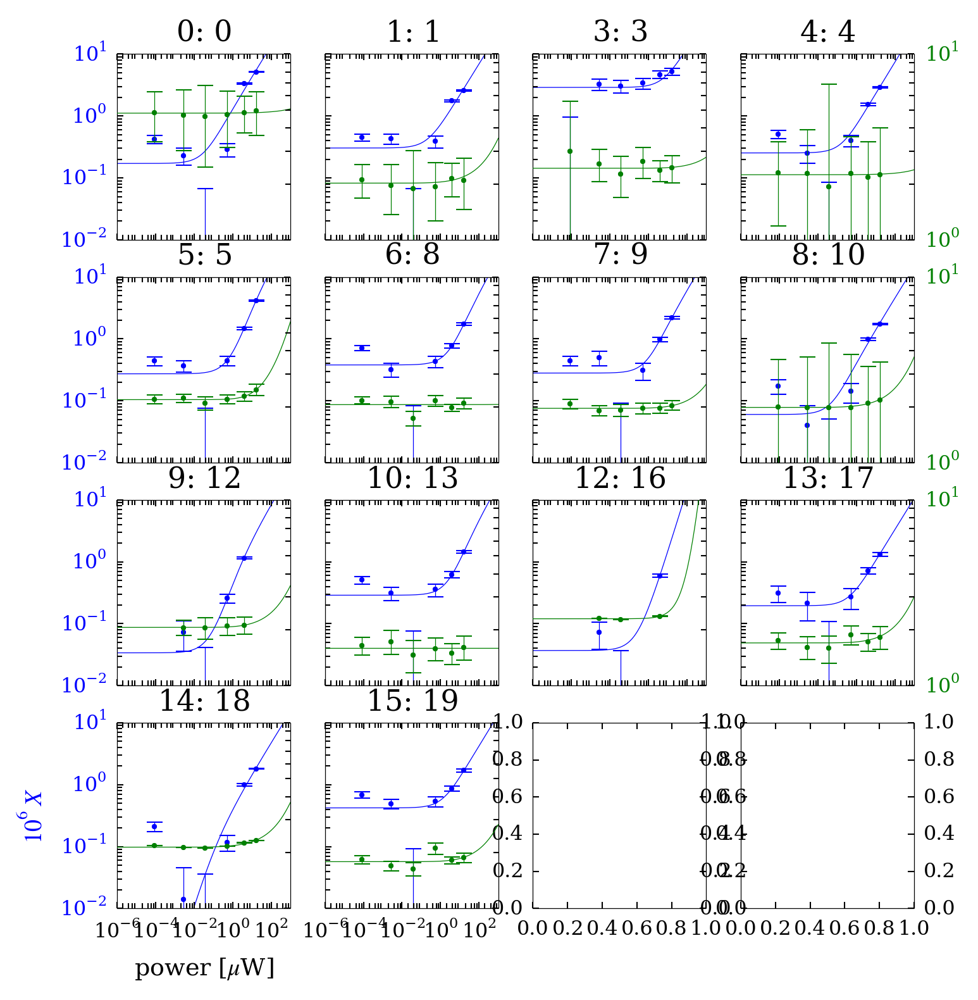

In [23]:
fig, X_axes, I_axes = plot_dataframe.plot_response(df[df.atten==38], 'source_power', loglog=True)

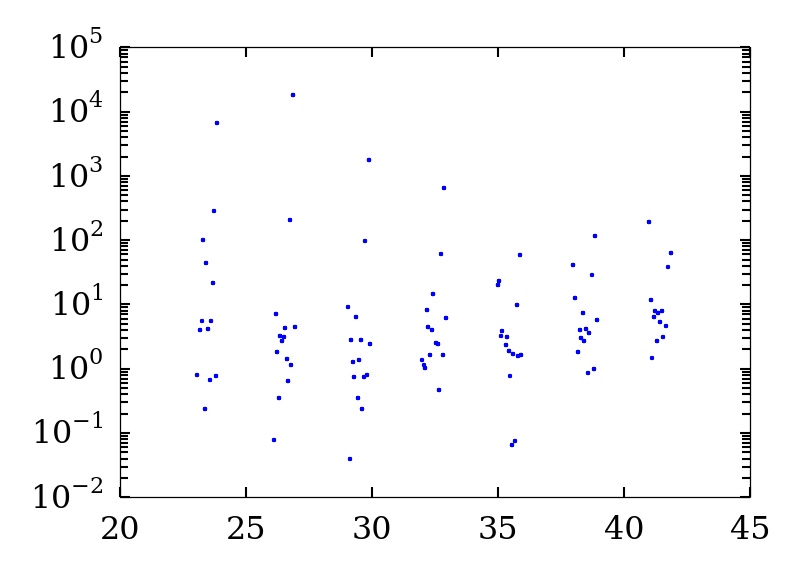

In [24]:
plt.semilogy(df.atten + df.channel / 16, df.source_power_XI_fit_redchi, '.', ms=1)

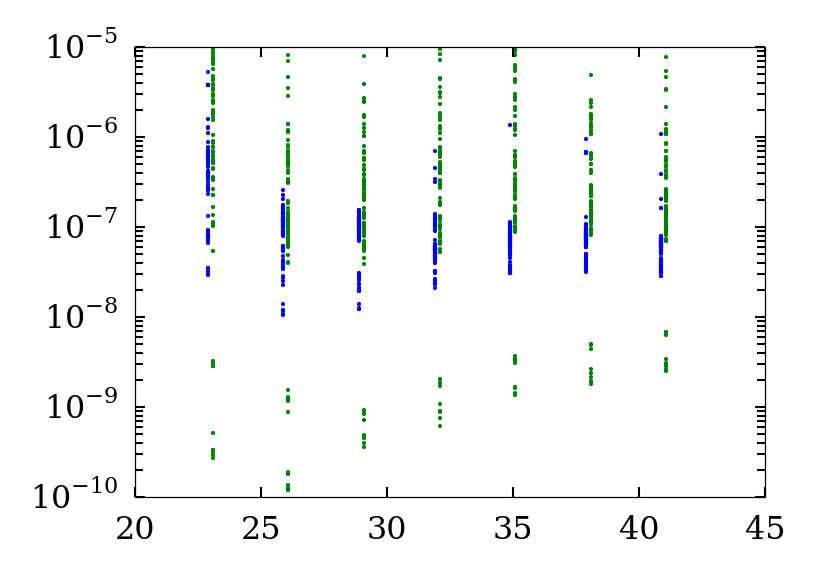

In [25]:
plt.semilogy(df.atten - 0.1, df.source_power_X_err, '.b', ms=1)
plt.semilogy(df.atten + 0.1, df.source_power_I_err, '.g', ms=1)

# $X_0, I_0$

fig, ax = plt.subplots()
ax.errorbar(df.atten + df.channel / 16, df.zbd_power_XI_fit_X_0, yerr=df.zbd_power_XI_fit_X_0_err, marker='.', linestyle='None')
ax.errorbar(df.atten + df.channel / 16, df.zbd_power_XI_fit_I_0, yerr=df.zbd_power_XI_fit_I_0_err, marker='.', linestyle='None')
ax.set_yscale('log', nonposy='clip')
plt.ylim(1e-7, 2e-4);

fig, ax = plt.subplots()
ax.errorbar(df.atten / 41 + df.channel, df.zbd_power_XI_fit_X_0, yerr=df.zbd_power_XI_fit_X_0_err, marker='.', linestyle='None')
ax.errorbar(df.atten / 41 + df.channel, df.zbd_power_XI_fit_I_0, yerr=df.zbd_power_XI_fit_I_0_err, marker='.', linestyle='None')
ax.set_yscale('log', nonposy='clip')
plt.ylim(1e-7, 2e-4);

# $P_0$

fig, ax = plt.subplots()
ax.errorbar(df.atten + df.channel / 16, df.zbd_power_XI_fit_P_0, yerr=df.zbd_power_XI_fit_P_0_err, marker='.', linestyle='None')
ax.set_yscale('log', nonposy='clip')
ax.set_ylim(1e-10, 1e-6)

fig, ax = plt.subplots()
ax.errorbar(df.channel + df.atten / 41, df.zbd_power_XI_fit_P_0, yerr=df.zbd_power_XI_fit_P_0_err, marker='.', linestyle='None')
ax.set_yscale('log', nonposy='clip')
ax.set_ylim(1e-10, 1e-6)

# $P_*$

fig, ax = plt.subplots()
ax.errorbar(df.channel + df.atten / 41, df.zbd_power_XI_fit_P_star, yerr=df.zbd_power_XI_fit_P_star_err, marker='.', linestyle='None')
ax.set_yscale('log', nonposy='clip')
ax.set_ylim(3e-8, 1e-6)

fig, ax = plt.subplots()
ax.errorbar(df.atten + df.channel / 16, df.zbd_power_XI_fit_P_star, yerr=df.zbd_power_XI_fit_P_star_err, marker='.', linestyle='None')
ax.set_yscale('log', nonposy='clip')
ax.set_ylim(3e-8, 1e-6)

# $I_C$

fig, ax = plt.subplots()
ax.errorbar(df.atten + df.channel / 16, 1e6 * df.zbd_power_XI_fit_I_C, yerr=1e6 * df.zbd_power_XI_fit_I_C_err, marker='.', linestyle='None')
ax.set_ylim(-1, 15)

fig, ax = plt.subplots()
ax.errorbar(df.atten / 41 + df.channel, 1e6 * df.zbd_power_XI_fit_I_C, yerr=1e6 * df.zbd_power_XI_fit_I_C_err, marker='.', linestyle='None')
ax.set_ylim(-1, 15)

# $S_{xx}$

In [ ]:
dark_channels = (0, 2, 4, 10)
bad_channels = (12, 14)

In [ ]:
channel = 15 # 8
ch = df[(df.channel==channel) & (df.atten != 41)]
mappable = plt.cm.ScalarMappable(matplotlib.colors.Normalize(min(ch.atten), max(ch.atten)),
                                 cmap=plt.cm.coolwarm)
mappable.set_array(np.unique(ch.atten))

fig, ax = plt.subplots()
for atten, group in ch.groupby('atten'):
    group = group.sort('zbd_power')
    ax.loglog(1e6 * group.zbd_power, group.noise_fit_amplifier_noise,
'--', color=mappable.to_rgba(atten))  #, label=str(atten))
    ax.loglog(1e6 * group.zbd_power, group.noise_fit_device_noise,
              '-', color=mappable.to_rgba(atten), label=str(atten))
ax.legend(loc='best', fontsize='xx-small')
ax.set_ylim(3e-19, 1e-16);

PP = np.logspace(-4, 2, 1e3)
ax.loglog(PP, 1.5e-18 * PP**(1/2), '-k');

In [ ]:
atten = 23

fig, ax = plt.subplots()
for channel, group in df[df.atten==atten].groupby('channel'):
    if channel not in bad_channels and channel not in dark_channels:
        group = group.sort('source_power')
        ax.loglog(1e6 * group.source_power, group.noise_fit_amplifier_noise, '-', color='black')
        ax.loglog(1e6 * group.source_power, group.noise_fit_device_noise, '-', color='red')

ax.set_ylim(1e-19, 1e-15)
ax.set_xlabel('source power [$\mu$W]')
ax.set_ylabel('$S_{xx} \; [\mathrm{Hz}^{-1}]$');

# NEP

In [ ]:
atten = 23

fig, ax = plt.subplots()
for channel, group in df[df.atten==atten].groupby('channel'):
    if channel not in dark_channels:
        group = group.sort('source_power')
        ax.loglog(1e6 * group.source_power, group.source_power_NEP2_device**(1/2), '-', alpha=0.8, color='red')
#        ax.loglog(1e6 * group.zbd_power, group.zbd_power_NEP2_amplifier**(1/2), '-', alpha=0.8, color='orange')
    elif channel in dark_channels:
        group = group.sort('source_power')
        ax.loglog(1e6 * group.source_power, group.source_power_NEP2_device**(1/2), '-', alpha=0.8, color='black')
#        ax.loglog(1e6 * group.zbd_power, group.zbd_power_NEP2_amplifier**(1/2), '-', alpha=0.8, color='gray')

ax.set_xlabel('source power $P_S$ [$\mu$W]')
ax.set_ylabel('$\mathrm{NEP}_S \; [\mathrm{W} \, \mathrm{Hz}^{-1/2}]$')

PP = np.logspace(-4, 2, 1e3)
ax.loglog(PP, 2e-11 * PP**(1/2), '--b')

ax.set_ylim(3e-12, 1e-9);
#ax.set_ylim(1e-13, 1e-9);

In [ ]:
atten = 29

fig, ax = plt.subplots()
for channel, group in df[df.atten==atten].groupby('channel'):
    if channel not in dark_channels:
        group = group.sort('source_power')
        ax.loglog(1e6 * group.source_power, group.source_power_NEP2_device**(1/2), '-', alpha=0.8, label=str(channel))

ax.set_xlabel('source power $P_S$ [$\mu$W]')
ax.set_ylabel('$\mathrm{NEP}_S \; [\mathrm{W} \, \mathrm{Hz}^{-1/2}]$')

PP = np.logspace(-4, 2, 1e3)
ax.loglog(PP, 2e-11 * PP**(1/2), '--b')

ax.set_xlim(1e-1, 1e2)
ax.set_ylim(1e-11, 3e-10)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize='xx-small');

In [ ]:
atten = 29

fig, ax = plt.subplots()
for channel, group in df[df.atten==atten].groupby('channel'):
    if channel not in dark_channels:
        group = group.sort('source_power')
        ax.semilogy(group.mmw_atten_total_turns/2,
                    group.source_power_NEP2_device**(1/2), '-', alpha=0.8, label=str(channel))

ax.set_xlabel('attenuator turns')
ax.set_ylabel('$\mathrm{NEP}_S \; [\mathrm{W} \, \mathrm{Hz}^{-1/2}]$')

ax.set_xlim(10, 2)
ax.set_ylim(1e-11, 3e-10)
ax.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize='xx-small')

In [ ]:
from scipy.constants import h

In [ ]:
four_turns = df[(df.atten==29) & (df.timestream_modulation_duty_cycle==0) & (df.mmw_atten_total_turns/2==4.0)].copy()
four_turns.shape

In [ ]:
four_turns['eta_zeta'] = (four_turns.source_power_dX_dP**2 * (4 * h * four_turns.timestream_mmw_source_freq * four_turns.zbd_power) /
                          four_turns.noise_fit_device_noise)
1e6 * four_turns.eta_zeta

In [ ]:
atten = 23

fig, ax = plt.subplots()
for channel, group in df[df.atten==atten].groupby('channel'):
    eta_zeta = float(four_turns[four_turns.channel==channel].eta_zeta)
    if channel not in dark_channels:
        group = group.sort('source_power')
        ax.loglog(1e12 * eta_zeta * group.source_power,
                  eta_zeta * group.source_power_NEP2_device**(1/2),
                  '-', alpha=0.8, color='red')
    elif channel in dark_channels:
        group = group.sort('source_power')
        ax.loglog(1e12 * eta_zeta * group.source_power,
                  eta_zeta * group.source_power_NEP2_device**(1/2),
                  '-', alpha=0.8, color='black')

ax.set_xlabel('absorbed power [pW]')
ax.set_ylabel('$\mathrm{NEP}_A \; [\mathrm{W} \, \mathrm{Hz}^{-1/2}]$')

PP = np.logspace(-4, 2, 1e3)
ax.loglog(PP, 1.3e-17 * PP**(1/2), '--b')

#ax.set_xlim(3e-12, 1e-9);
#ax.set_ylim(1e-13, 1e-9);

In [ ]:
from kid_readout.analysis import plot_wafer

In [ ]:
plot_wafer.scatter(1e6 * np.array(four_turns.eta_zeta), mask=np.array(four_turns.location))

In [ ]:
atten = 32

fig, ax = plt.subplots()
for channel, group in df[df.atten==atten].groupby('channel'):
    if channel not in dark_channels:
        group = group.sort('source_power')
        ax.loglog(1e6 * group.source_power,
                  group.source_power_NEP2_device**(1/2) / group.source_power,
                  '-', alpha=0.8, color='red')
    elif channel in dark_channels:
        group = group.sort('source_power')
        ax.loglog(1e6 * group.source_power,
                  group.source_power_NEP2_device**(1/2) / group.source_power,
                  '-', alpha=0.8, color='black')

ax.set_xlabel('source power $P_S$ [$\mu$W]')
ax.set_ylabel('$\mathrm{NEP}_S  / P_S \; [\mathrm{Hz}^{-1/2}]$')

min_nep_over_p = 1.3e-5
ax.axhline(min_nep_over_p, linestyle='--', color='blue')
delta_nu = 2 * min_nep_over_p**-2
print("Bandwidth {:.1f} GHz".format(1e-9 * delta_nu))

# Readout power

In [ ]:
df['chi_c'] = 4 * df.Q**2 / (df.Q_i * abs(df.Q_e_real + 1j * df.Q_e_imag))

In [ ]:
fig, ax = plt.subplots()

for channel, group in df[df.resonator_fit_good & (df.atten < 41)].groupby('channel'):
    mappable = plt.cm.ScalarMappable(matplotlib.colors.Normalize(min(group.atten), max(group.atten)), cmap=plt.cm.coolwarm)
    mappable.set_array(np.unique(group.atten))
    for atten, atten_group in group.groupby('atten'):
        atten_group = atten_group.sort('source_power')
        ax.semilogx(1e6 * atten_group.source_power,
                    atten_group.chi_c,
                    '-', color=mappable.to_rgba(atten), alpha=0.4)
ax.set_ylim(0, 1.2)
ax.set_xlabel('source power [$\mu$W]')
ax.set_ylabel('$\chi_c$');